# **H20 AutoML**

## Importing required Libraries and H20 Initialization
Automated machine learning (AutoML) is the process of automating the end-to-end process of applying machine learning to real-world problems.

H2O AutoML automates the steps like basic data processing, model training and tuning, Ensemble and stacking of various models to provide the models with the best performance so that developers can focus on other steps like data collection, feature engineering and deployment of model.

We are initializing H2O in the following steps.

In [68]:
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install seaborn matplotlib

In [69]:
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o

Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html


In [70]:
import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import sklearn
from sklearn.model_selection import train_test_split
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

In [71]:
min_mem_size=6
run_time=222

In [72]:
pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)

3


In [73]:
# 65535 Highest port no
# Start the H2O server on a random port
port_no = random.randint(5555, 55555)
#  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
try:
    h2o.init(
        strict_version_check=False, min_mem_size_GB=min_mem_size, port=port_no
    )  # start h2o
except:
    logging.critical("h2o.init")
    h2o.download_all_logs(dirname=logs_path, filename=logfile)
    h2o.cluster().shutdown()
    sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:29726..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.21" 2023-10-17; OpenJDK Runtime Environment (build 11.0.21+9-post-Ubuntu-0ubuntu122.04); OpenJDK 64-Bit Server VM (build 11.0.21+9-post-Ubuntu-0ubuntu122.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmp_aij6y1s
  JVM stdout: /tmp/tmp_aij6y1s/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmp_aij6y1s/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:29726
Connecting to H2O server at http://127.0.0.1:29726 ... successful.


H2O_cluster_uptime:,10 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.44.0.3
H2O_cluster_version_age:,1 month and 30 days
H2O_cluster_name:,H2O_from_python_unknownUser_h9mris
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.170 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


In [74]:
# Import the processed data from notebook One
# path = '/content/final_dataset (1).csv'
# df = h2o.import_file(path = path)
# dff = pd.read_csv('/content/final_dataset (1).csv')
# Import the processed data from notebook One
url = "https://raw.githubusercontent.com/VivekReddy08/INFO6105DataScience/main/Football_Match%20Prediction.csv"
df = h2o.import_file(path = url)
dff = pd.read_csv("https://raw.githubusercontent.com/VivekReddy08/INFO6105DataScience/main/Football_Match%20Prediction.csv")

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [75]:
dff.head()

,Unnamed: 0,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTGS,ATGS,HTGC,...,HTLossStreak3,HTLossStreak5,ATWinStreak3,ATWinStreak5,ATLossStreak3,ATLossStreak5,HTGD,ATGD,DiffPts,DiffFormPts
0,0,19/08/00,Charlton,Man City,4,0,H,0,0,0,...,0,0,0,0,0,0,0.0,0.0,0.0,0.0
1,1,19/08/00,Chelsea,West Ham,4,2,H,0,0,0,...,0,0,0,0,0,0,0.0,0.0,0.0,0.0
2,2,19/08/00,Coventry,Middlesbrough,1,3,NH,0,0,0,...,0,0,0,0,0,0,0.0,0.0,0.0,0.0
3,3,19/08/00,Derby,Southampton,2,2,NH,0,0,0,...,0,0,0,0,0,0,0.0,0.0,0.0,0.0
4,4,19/08/00,Leeds,Everton,2,0,H,0,0,0,...,0,0,0,0,0,0,0.0,0.0,0.0,0.0


In [76]:
#Gettig the list of numerical features
num_cols = dff._get_numeric_data().columns
num_cols, len(num_cols)

(Index(['Unnamed: 0', 'FTHG', 'FTAG', 'HTGS', 'ATGS', 'HTGC', 'ATGC', 'HTP',
        'ATP', 'MW', 'HTFormPts', 'ATFormPts', 'HTWinStreak3', 'HTWinStreak5',
        'HTLossStreak3', 'HTLossStreak5', 'ATWinStreak3', 'ATWinStreak5',
        'ATLossStreak3', 'ATLossStreak5', 'HTGD', 'ATGD', 'DiffPts',
        'DiffFormPts'],
       dtype='object'),
 24)

In [77]:
#Gettig the list of categorical features
cat_cols = dff.select_dtypes(include=['object']).columns.tolist()
cat_cols, len(cat_cols)

(['Date',
  'HomeTeam',
  'AwayTeam',
  'FTR',
  'HM1',
  'HM2',
  'HM3',
  'HM4',
  'HM5',
  'AM1',
  'AM2',
  'AM3',
  'AM4',
  'AM5',
  'HTFormPtsStr',
  'ATFormPtsStr'],
 16)

In [78]:
# converting categorical features into numerical
for cat_col in cat_cols:
  classes = list(np.unique(dff[cat_col]))
  tokens = []
  i = 0
  for c in classes:
    tokens.append(i)
    i += 1

  dff[cat_col].replace(classes, tokens, inplace=True)

In [79]:
dff.head()

,Unnamed: 0,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTGS,ATGS,HTGC,...,HTLossStreak3,HTLossStreak5,ATWinStreak3,ATWinStreak5,ATLossStreak3,ATLossStreak5,HTGD,ATGD,DiffPts,DiffFormPts
0,0,1065,11,24,4,0,0,0,0,0,...,0,0,0,0,0,0,0.0,0.0,0.0,0.0
1,1,1065,12,41,4,2,0,0,0,0,...,0,0,0,0,0,0,0.0,0.0,0.0,0.0
2,2,1065,13,27,1,3,1,0,0,0,...,0,0,0,0,0,0,0.0,0.0,0.0,0.0
3,3,1065,15,34,2,2,1,0,0,0,...,0,0,0,0,0,0,0.0,0.0,0.0,0.0
4,4,1065,21,16,2,0,0,0,0,0,...,0,0,0,0,0,0,0.0,0.0,0.0,0.0


In [80]:
dff.isnull().sum()  # Checking for any null values in the dataset, as we hav no null values - we are good to go.

Unnamed: 0       0
Date             0
HomeTeam         0
AwayTeam         0
FTHG             0
FTAG             0
FTR              0
HTGS             0
ATGS             0
HTGC             0
ATGC             0
HTP              0
ATP              0
HM1              0
HM2              0
HM3              0
HM4              0
HM5              0
AM1              0
AM2              0
AM3              0
AM4              0
AM5              0
MW               0
HTFormPtsStr     0
ATFormPtsStr     0
HTFormPts        0
ATFormPts        0
HTWinStreak3     0
HTWinStreak5     0
HTLossStreak3    0
HTLossStreak5    0
ATWinStreak3     0
ATWinStreak5     0
ATLossStreak3    0
ATLossStreak5    0
HTGD             0
ATGD             0
DiffPts          0
DiffFormPts      0
dtype: int64

In [81]:
dff.describe()  # Statistical description of our dataset

,Unnamed: 0,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTGS,ATGS,HTGC,...,HTLossStreak3,HTLossStreak5,ATWinStreak3,ATWinStreak5,ATLossStreak3,ATLossStreak5,HTGD,ATGD,DiffPts,DiffFormPts
count,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,...,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000,6840.000000
mean,3419.500000,913.169006,22.311111,22.311111,1.527485,1.130263,0.535673,24.416667,24.514327,24.497807,...,0.057602,0.014327,0.062865,0.016520,0.051023,0.010234,-0.009690,0.014539,-0.017755,-0.018086
std,1974.682253,533.075822,13.163109,13.163109,1.297913,1.124566,0.498762,17.178524,17.136894,16.401571,...,0.233007,0.118846,0.242739,0.127475,0.220062,0.100651,0.693593,0.692937,0.668523,0.408488
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-3.000000,-3.333333,-2.363636,-2.250000
25%,1709.750000,460.750000,12.000000,12.000000,1.000000,0.000000,0.000000,11.000000,11.000000,11.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.500000,-0.464286,-0.451613,-0.176471
50%,3419.500000,912.000000,24.000000,24.000000,1.000000,1.000000,1.000000,23.000000,23.000000,23.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.076923,-0.050000,0.000000,0.000000
75%,5129.250000,1390.000000,35.000000,35.000000,2.000000,2.000000,1.000000,35.000000,35.000000,36.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.400000,0.421053,0.428571,0.153846
max,6839.000000,1803.000000,43.000000,43.000000,9.000000,7.000000,1.000000,102.000000,105.000000,85.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,4.000000,3.500000,2.285714,2.250000


Representing the same matrix in form of heatmap where shades of blue signify inverse relation and shades of red signify direct relation.

Text(0.5, 1.0, 'Variable Correlation')

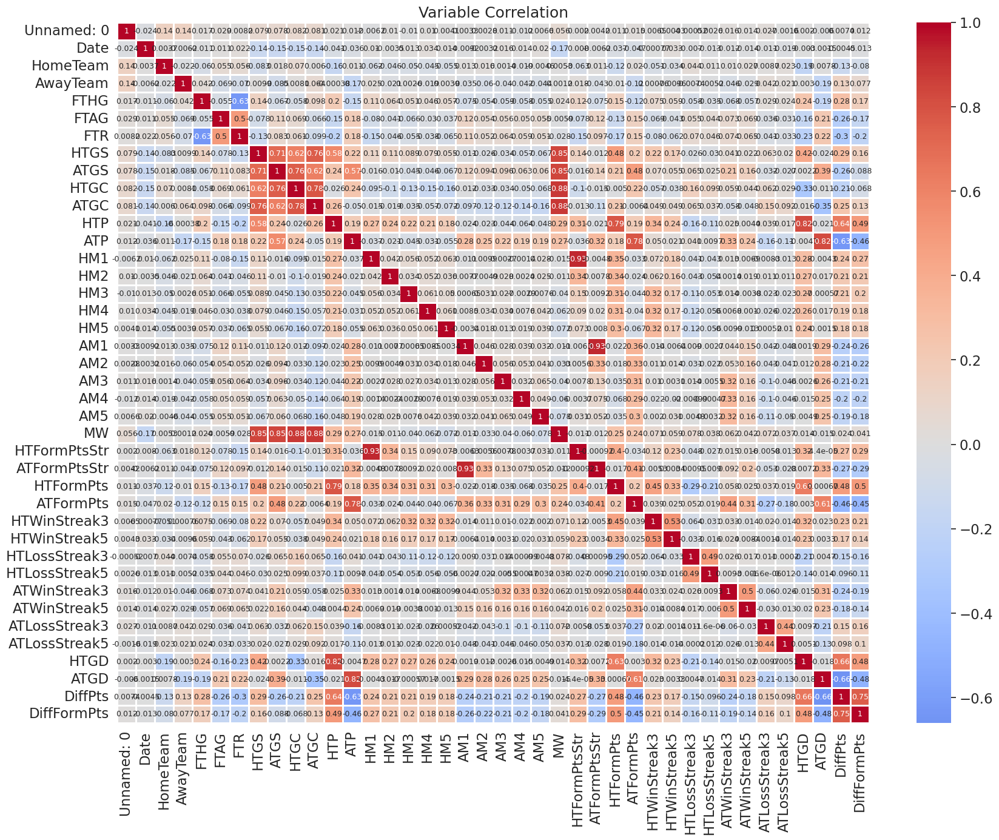

In [82]:
#Representing Matrix as a plot
from IPython.core.pylabtools import figsize
f,ax=plt.subplots(figsize=(20,15))

sns.heatmap(dff.corr(),center=0, linewidths=0.8,cmap='coolwarm',annot=True, annot_kws={"size": 9})
plt.title('Variable Correlation')

# Correlation Analysis
Above is a graphical representation of the correlation between different features in the dataset. The heatmap displays a matrix of colors that represent the strength of the correlation between pairs of variables.

We can calculate the correlation between pairs of variables using a correlation coefficient, such as the Pearson correlation coefficient. This coefficient measures the linear relationship between two variables, with values ranging from -1 (perfect negative correlation) to 1 (perfect positive correlation). A value of 0 indicates no correlation.

The above heatmap displays the correlation coefficients as colors in a matrix, with each variable plotted both on the x and y axis. The color of each cell in the matrix indicates the strength of the correlation between the corresponding pair of variables, with a color scale ranging from low to high .

A correlation heatmap can help you identify the relationships between pairs of variables in a dataset. You can use it to spot patterns and trends, and to identify variables that are strongly correlated (either positively or negatively). This information can be useful for exploratory data analysis and for identifying potential predictors in statistical models.

Plotting all variables against other variables to see if relation exists between them. Basically it tells the same thing as correlation matrix but in a graphical way.

From the Above Matrix we can conclude that HTGD, ATGD, DiffPts, DiffFormPts are highly correlated .


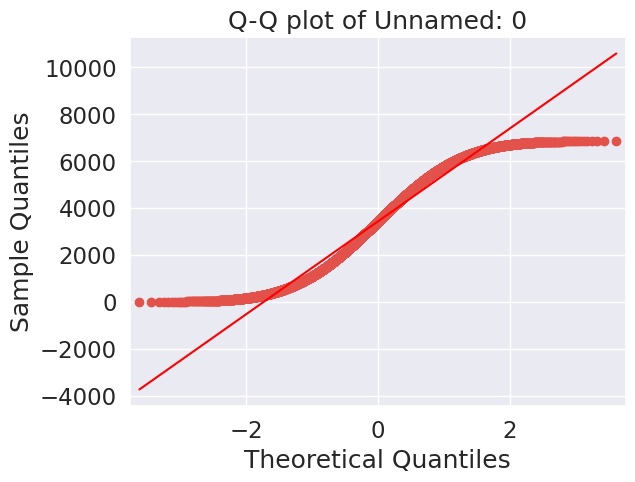

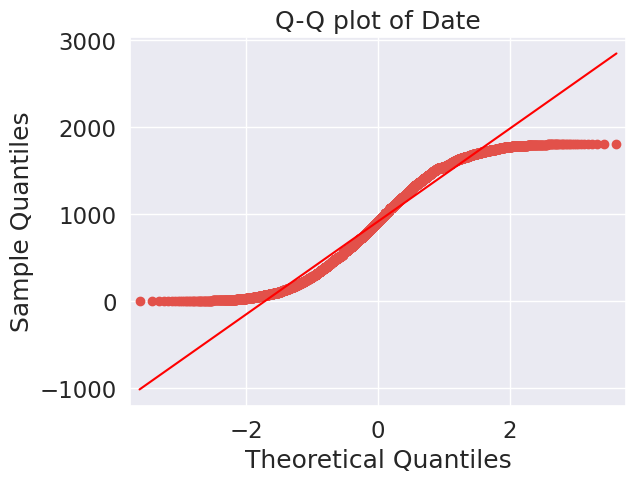

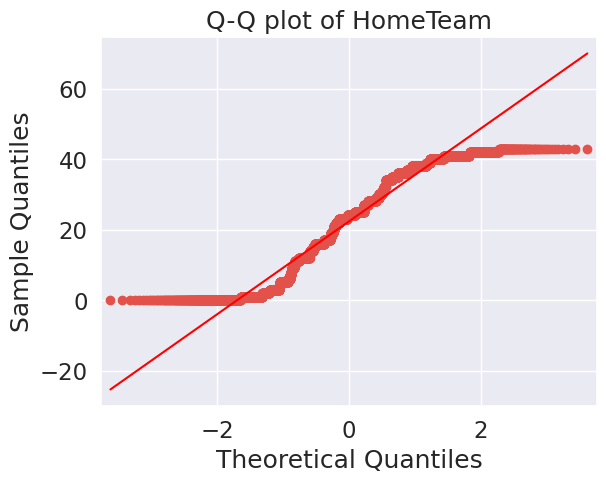

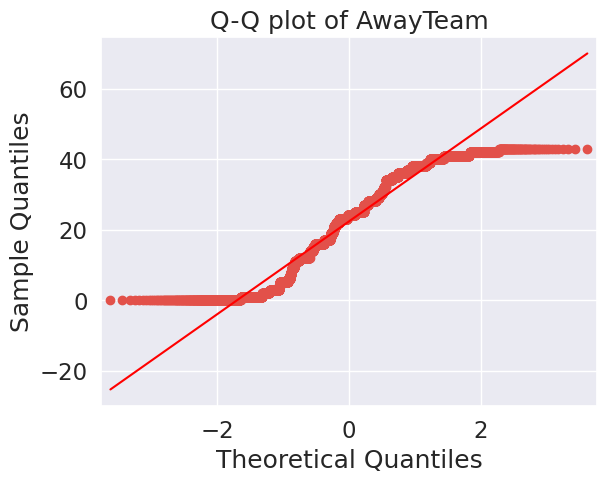

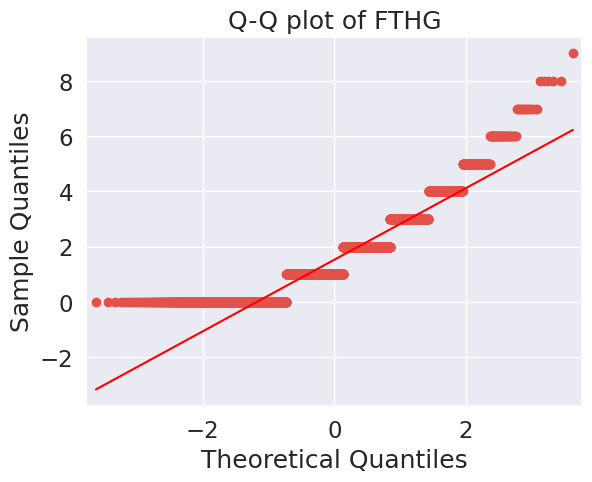

...

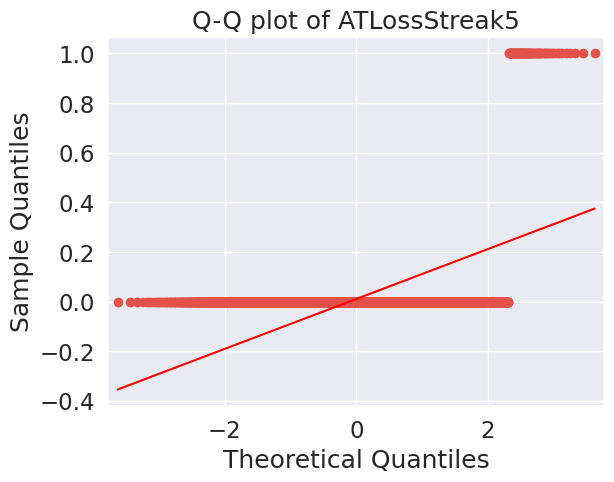

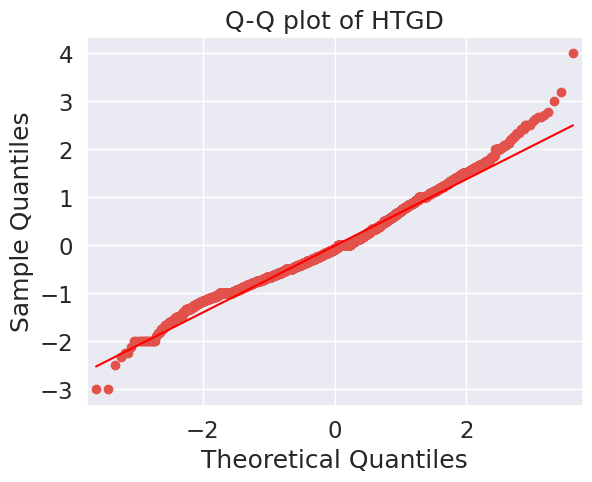

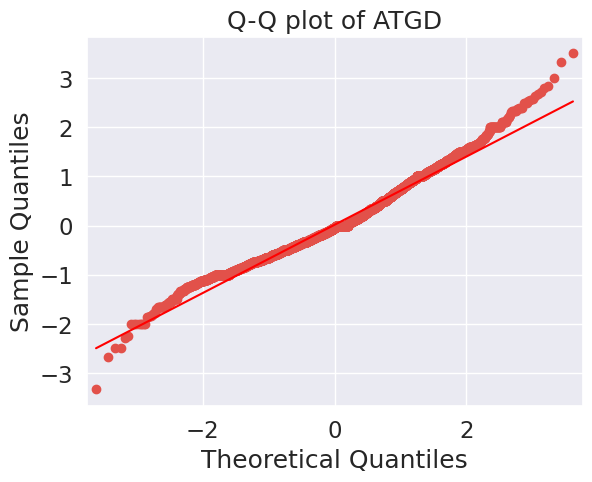

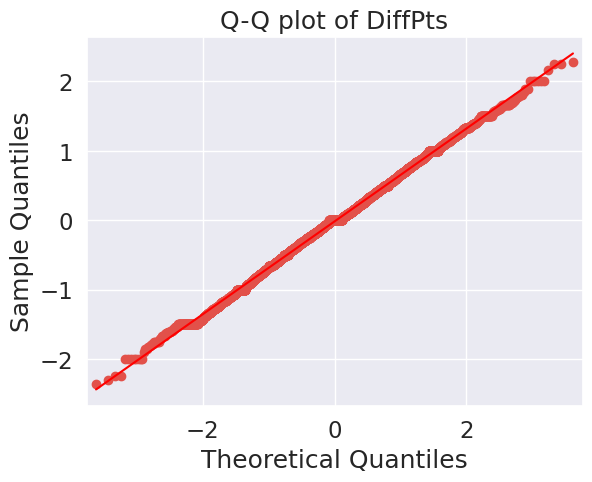

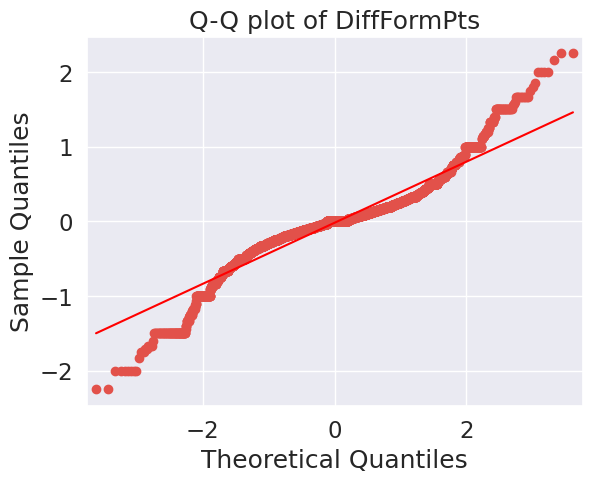

In [83]:
import statsmodels.api as sm
for col in dff.columns:
    sm.qqplot(dff[col], line='s')
    plt.title('Q-Q plot of ' + col)
    plt.show()

In [84]:
df = h2o.H2OFrame(
    dff
)  # Converted Pandas Dataframe to H2O dataframe to proceed with AutoML

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [85]:
df.types

{'Unnamed: 0': 'int',
 'Date': 'int',
 'HomeTeam': 'int',
 'AwayTeam': 'int',
 'FTHG': 'int',
 'FTAG': 'int',
 'FTR': 'int',
 'HTGS': 'int',
 'ATGS': 'int',
 'HTGC': 'int',
 'ATGC': 'int',
 'HTP': 'real',
 'ATP': 'real',
 'HM1': 'int',
 'HM2': 'int',
 'HM3': 'int',
 'HM4': 'int',
 'HM5': 'int',
 'AM1': 'int',
 'AM2': 'int',
 'AM3': 'int',
 'AM4': 'int',
 'AM5': 'int',
 'MW': 'int',
 'HTFormPtsStr': 'int',
 'ATFormPtsStr': 'int',
 'HTFormPts': 'int',
 'ATFormPts': 'int',
 'HTWinStreak3': 'int',
 'HTWinStreak5': 'int',
 'HTLossStreak3': 'int',
 'HTLossStreak5': 'int',
 'ATWinStreak3': 'int',
 'ATWinStreak5': 'int',
 'ATLossStreak3': 'int',
 'ATLossStreak5': 'int',
 'HTGD': 'real',
 'ATGD': 'real',
 'DiffPts': 'real',
 'DiffFormPts': 'real'}

In [86]:
pct_rows = 0.80  # Setting up the data split between training and test dataset.
df_train, df_test = df.split_frame([pct_rows])

In [87]:
print(df_train.shape)
print(df_test.shape)

(5491, 40)
(1349, 40)


In [88]:
df_train.head()

Unnamed: 0,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTGS,ATGS,HTGC,ATGC,HTP,ATP,HM1,HM2,HM3,HM4,HM5,AM1,AM2,AM3,AM4,AM5,MW,HTFormPtsStr,ATFormPtsStr,HTFormPts,ATFormPts,HTWinStreak3,HTWinStreak5,HTLossStreak3,HTLossStreak5,ATWinStreak3,ATWinStreak5,ATLossStreak3,ATLossStreak5,HTGD,ATGD,DiffPts,DiffFormPts
0,1065,11,24,4,0,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1065,12,41,4,2,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1065,13,27,1,3,1,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1065,21,16,2,0,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0,0,0
5,1065,22,1,0,0,1,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0,0,0
6,1065,23,7,1,0,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0,0,0
7,1065,36,0,1,0,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0,0,0
8,1065,38,20,3,1,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0,0,0
9,1126,25,28,2,0,0,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0,0,0
10,1197,0,23,2,0,0,0,1,1,0,0,1.5,1,2,2,2,2,3,2,2,2,2,2,190,320,0,3,0,0,0,0,0,0,0,0,-0.5,0.5,-1.5,-1.5


In [89]:
X = df.columns
print(X)

['Unnamed: 0', 'Date', 'HomeTeam', 'AwayTeam', 'FTHG', 'FTAG', 'FTR', 'HTGS', 'ATGS', 'HTGC', 'ATGC', 'HTP', 'ATP', 'HM1', 'HM2', 'HM3', 'HM4', 'HM5', 'AM1', 'AM2', 'AM3', 'AM4', 'AM5', 'MW', 'HTFormPtsStr', 'ATFormPtsStr', 'HTFormPts', 'ATFormPts', 'HTWinStreak3', 'HTWinStreak5', 'HTLossStreak3', 'HTLossStreak5', 'ATWinStreak3', 'ATWinStreak5', 'ATLossStreak3', 'ATLossStreak5', 'HTGD', 'ATGD', 'DiffPts', 'DiffFormPts']


In [90]:
# Set target and predictor variables
y = "FTR"
X.remove(y)  # Removing the result frm our predictors data
print(X)

['Unnamed: 0', 'Date', 'HomeTeam', 'AwayTeam', 'FTHG', 'FTAG', 'HTGS', 'ATGS', 'HTGC', 'ATGC', 'HTP', 'ATP', 'HM1', 'HM2', 'HM3', 'HM4', 'HM5', 'AM1', 'AM2', 'AM3', 'AM4', 'AM5', 'MW', 'HTFormPtsStr', 'ATFormPtsStr', 'HTFormPts', 'ATFormPts', 'HTWinStreak3', 'HTWinStreak5', 'HTLossStreak3', 'HTLossStreak5', 'ATWinStreak3', 'ATWinStreak5', 'ATLossStreak3', 'ATLossStreak5', 'HTGD', 'ATGD', 'DiffPts', 'DiffFormPts']


In [91]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)  # Setting of AutoML

In [92]:
aml.train(x=X, y=y, training_frame=df_train)  # Trainig the dataset on different models

AutoML progress: |
01:22:27.907: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

███████
01:22:50.238: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

██
01:22:55.837: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

██████████████████████
01:24:15.831: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.
01:24:16.750: _r

key,value
Stacking strategy,cross_validation
Number of base models (used / total),7/12
# GBM base models (used / total),5/5
# XGBoost base models (used / total),1/3
# DeepLearning base models (used / total),1/1
# DRF base models (used / total),0/2
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


# Understanding the Parameters
Mean Squared Error (MSE): The MSE measures the average squared difference between the predicted and actual values. It is calculated by taking the average of the squared differences between the predicted and actual values. It is a common metric for evaluating the accuracy of regression models.

Root Mean Squared Error (RMSE): The RMSE is the square root of the MSE, and it is a commonly used metric for evaluating the accuracy of regression models. The RMSE is a measure of how well the model is able to predict the actual values.

Mean Absolute Error (MAE): The MAE measures the average absolute difference between the predicted and actual values. It is calculated by taking the average of the absolute differences between the predicted and actual values. It is a common metric for evaluating the accuracy of regression models.

Root Mean Squared Logarithmic Error (RMSLE): The RMSLE is a variation of the RMSE that is used for regression models where the target variable has a wide range of values. It is calculated by taking the square root of the average of the squared differences between the logarithm of the predicted and actual values.

Mean Residual Deviance: The Mean Residual Deviance is a measure of the goodness of fit for a regression model. It measures the average difference between the predicted and actual values, normalized by the degrees of freedom of the model.

R-squared (R^2): The R-squared is a measure of how well the model fits the data. It is the proportion of the variance in the dependent variable that is explained by the independent variables. A value of 1 means that the model explains all the variability in the data, while a value of 0 means that the model explains none of the variability.

Null Degrees of Freedom: The Null Degrees of Freedom is the number of observations in the dataset minus 1. It represents the number of observations in the dataset that are free to vary, given the number of parameters in the model.

Residual Degrees of Freedom: The Residual Degrees of Freedom is the number of observations in the dataset minus the number of parameters in the model. It represents the number of observations in the dataset that are free to vary after taking into account the number of parameters in the model.

Null Deviance: The Null Deviance is the deviance of the null model, which is the model with no independent variables. It represents the variance in the dependent variable that is not explained by the independent variables.

Residual Deviance: The Residual Deviance is the deviance of the model after accounting for the independent variables. It represents the variance in the dependent variable that is not explained by the independent variables.

Akaike Information Criterion (AIC): The AIC is a measure of the quality of a model that takes into account the complexity of the model. It is calculated as the negative log-likelihood of the model plus twice the number of parameters in the model. The AIC can be used to compare the quality of different models, with lower values indicating better quality.



In [93]:
print(
    aml.leaderboard
)  # Leaderboard showing the performance of different models on the dataset.

model_id                                                     rmse          mse         mae      rmsle    mean_residual_deviance
StackedEnsemble_AllModels_2_AutoML_1_20240220_12227     0.0185591  0.00034444   0.00901902  0.0141715               0.00034444
StackedEnsemble_BestOfFamily_3_AutoML_1_20240220_12227  0.018651   0.000347861  0.00902457  0.0142219               0.000347861
DeepLearning_1_AutoML_1_20240220_12227                  0.02259    0.000510306  0.0101112   0.0171105               0.000510306
XGBoost_3_AutoML_1_20240220_12227                       0.0315867  0.00099772   0.015256    0.0233912               0.00099772
StackedEnsemble_AllModels_1_AutoML_1_20240220_12227     0.0371881  0.00138296   0.020924    0.0276952               0.00138296
StackedEnsemble_BestOfFamily_2_AutoML_1_20240220_12227  0.0416983  0.00173875   0.0266737   0.0310349               0.00173875
GBM_5_AutoML_1_20240220_12227                           0.0465065  0.00216286   0.0302605   0.0355079       

The models listed in the leaderboard are ranked based on their rmse score, where a lower score indicates better performance. The top row in the leaderboard represents the best-performing model with the lowest rmse score. The evaluation metrics can be used to compare the performance of different models and help in selecting the best model for the particular use case.

In this leaderboard, the best performing model is
StackedEnsemble_BestOfFamily_4_AutoML_1_20240219_12614  with rmse score of 1.65929

The models are then listed in descending order based on their rmse scores.

In [94]:
model_index = 0
glm_index = 0
glm_model = ""
aml_leaderboard_df = aml.leaderboard.as_data_frame()
models_dict = {}
for m in aml_leaderboard_df["model_id"]:
    models_dict[m] = model_index
    if "StackedEnsemble" not in m:
        break
    model_index = model_index + 1

for m in aml_leaderboard_df["model_id"]:
    if "GLM" in m:
        models_dict[m] = glm_index
        break
    glm_index = glm_index + 1
models_dict

Export File progress: |██████████████████████████████████████████████████████████| (done) 100%


{'StackedEnsemble_AllModels_2_AutoML_1_20240220_12227': 0,
 'StackedEnsemble_BestOfFamily_3_AutoML_1_20240220_12227': 1,
 'DeepLearning_1_AutoML_1_20240220_12227': 2,
 'GLM_1_AutoML_1_20240220_12227': 18}

In [95]:
print(model_index)
best_model = h2o.get_model(aml.leaderboard[model_index, "model_id"])

2


In [96]:
best_model.algo

'deeplearning'

In [97]:
import matplotlib.pyplot as plt

%matplotlib inline

import warnings
import matplotlib.cbook

warnings.filterwarnings("ignore", category=matplotlib.cbook.mplDeprecation)

In [98]:
if best_model.algo in ['gbm','drf','xrt','xgboost']:
    best_model.varimp_plot()

The above graph is a variable Importance Graph on the H20's Distributed Random Forest Model

We can Interpret that FTR is the Most Important Variable among all with importance of 1.0 (Think as if this Importance is scaled to 100%)

18
glm


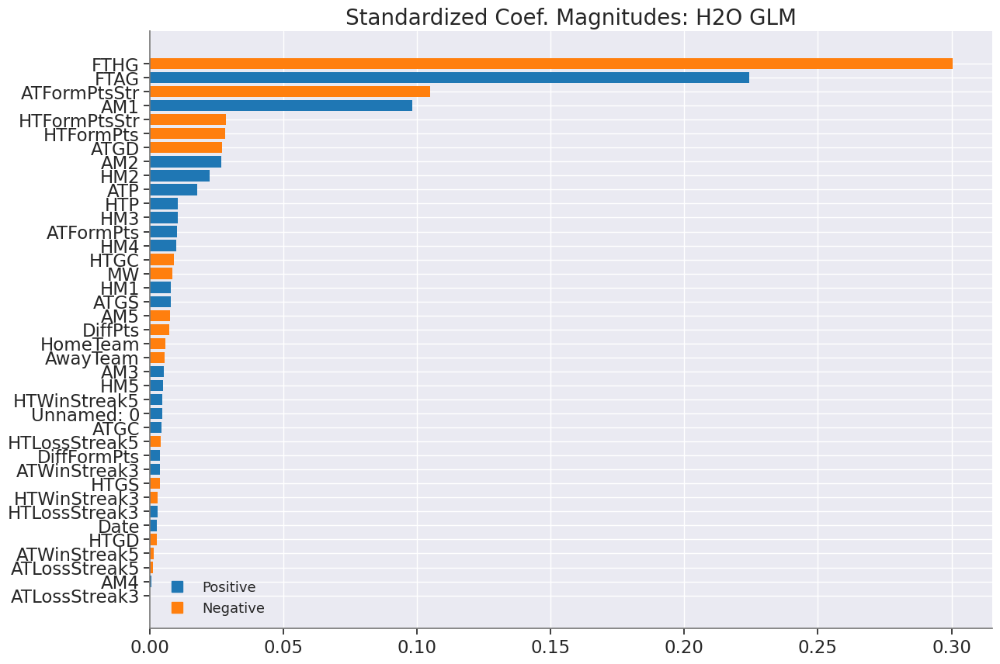

In [99]:
if glm_index is not 0:
    print(glm_index)
    glm_model = h2o.get_model(aml.leaderboard[glm_index, "model_id"])
    print(glm_model.algo)
    glm_model.std_coef_plot()

Standardized coefficient magnitudes (sometimes referred to as standardized coefficients or beta coefficients) are a measure of the importance of each input variable in a predictive model, after standardizing all variables to have a mean of zero and a standard deviation of one. The values of standardized coefficient magnitudes can range from negative infinity to positive infinity, but they are typically expressed as a percentage.

The values on standardized coefficient magnitudes represent the relative importance of each input variable in the model, after taking into account the scale of the variable. A higher magnitude value indicates that the variable has a stronger impact on the outcome variable, while a lower value indicates a weaker impact.

From the above results, we observe that FTHG, FTAG, ATFormPtsSTR are some of the important features.

In [100]:
print(best_model.rmse(train=True))

0.008896100378858273


In [101]:
def model_performance_stats(perf):
    d = {}
    try:
        d["mse"] = perf.mse()
    except:
        pass
    try:
        d["rmse"] = perf.rmse()
    except:
        pass
    try:
        d["null_degrees_of_freedom"] = perf.null_degrees_of_freedom()
    except:
        pass
    try:
        d["residual_degrees_of_freedom"] = perf.residual_degrees_of_freedom()
    except:
        pass
    try:
        d["residual_deviance"] = perf.residual_deviance()
    except:
        pass
    try:
        d["null_deviance"] = perf.null_deviance()
    except:
        pass
    try:
        d["aic"] = perf.aic()
    except:
        pass
    try:
        d["logloss"] = perf.logloss()
    except:
        pass
    try:
        d["auc"] = perf.auc()
    except:
        pass
    try:
        d["gini"] = perf.gini()
    except:
        pass
    return d

In [102]:
mod_perf = best_model.model_performance(df_test)
stats_test = {}
stats_test = model_performance_stats(mod_perf)
stats_test

{'mse': 0.0001230021694871253,
 'rmse': 0.011090634314011319,
 'null_degrees_of_freedom': None,
 'residual_degrees_of_freedom': None,
 'residual_deviance': None,
 'null_deviance': None}

In [103]:
predictions = best_model.predict(df_test)

deeplearning prediction progress: |██████████████████████████████████████████████| (done) 100%


In [104]:
y_pred = h2o.as_list(
    predictions
)  # Predictions on Test Dataset using the best model from the leaderboard.
print(y_pred)

Export File progress: |██████████████████████████████████████████████████████████| (done) 100%
       predict
0     1.003068
1     0.001547
2     1.002897
3     1.000511
4    -0.001961
...        ...
1344  0.005723
1345  1.000426
1346  0.003292
1347  0.004007
1348  0.006388

[1349 rows x 1 columns]


In [105]:
y_test = h2o.as_list(df_test[y])  # Real Answers
y_test

Export File progress: |██████████████████████████████████████████████████████████| (done) 100%


,FTR
0,1
1,0
2,1
3,1
4,0
...,...
1344,0
1345,1
1346,0
1347,0


In [106]:
print(X)

['Unnamed: 0', 'Date', 'HomeTeam', 'AwayTeam', 'FTHG', 'FTAG', 'HTGS', 'ATGS', 'HTGC', 'ATGC', 'HTP', 'ATP', 'HM1', 'HM2', 'HM3', 'HM4', 'HM5', 'AM1', 'AM2', 'AM3', 'AM4', 'AM5', 'MW', 'HTFormPtsStr', 'ATFormPtsStr', 'HTFormPts', 'ATFormPts', 'HTWinStreak3', 'HTWinStreak5', 'HTLossStreak3', 'HTLossStreak5', 'ATWinStreak3', 'ATWinStreak5', 'ATLossStreak3', 'ATLossStreak5', 'HTGD', 'ATGD', 'DiffPts', 'DiffFormPts']


# Regularization
In this Section, we will be using the GLM model to check if regularization is helping us to improve the accuracy and reduce overfitting.

Ridge and Lasso are regularization techniques used in linear regression to prevent overfitting and improve the model's generalization ability.

Ridge regularization adds a penalty term to the least-squares objective function of the linear regression model. This penalty term is proportional to the square of the magnitude of the coefficients of the model, which shrinks the coefficients towards zero. The strength of the penalty is controlled by a hyperparameter called the regularization parameter, which needs to be tuned to achieve the best performance. Ridge regularization is particularly useful when there are many input variables that are correlated with each other, as it can help to reduce the variance of the model by reducing the effect of these correlated variables.

Lasso regularization is similar to Ridge regularization, but instead of adding a penalty term proportional to the square of the coefficients, it adds a penalty term proportional to the absolute value of the coefficients. This penalty term can set some coefficients to exactly zero, which makes Lasso regularization a useful method for feature selection. By setting some coefficients to zero, Lasso can effectively remove irrelevant variables from the model, which can lead to a simpler and more interpretable model.

The main difference between Ridge and Lasso regularization is the type of penalty function used. Ridge uses L2 regularization, while Lasso uses L1 regularization. L2 regularization tends to distribute the penalty evenly across all coefficients, while L1 regularization tends to concentrate the penalty on a smaller subset of the most important coefficients. Which method to use depends on the specific problem and the properties of the input variables.

In [107]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

hotel_glm = H2OGeneralizedLinearEstimator(
    family="gaussian", lambda_=0, compute_p_values=True, nfolds=5
)  # Elastic Net Regularization
hotel_glm_regularization_ridge = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=0, nfolds=5
)  # RIDGE Regularization
hotel_glm_regularization_lasso = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=1, nfolds=5
)  # LASSO Regularization
hotel_glm_regularization_lamba_search = H2OGeneralizedLinearEstimator(
    lambda_search=True
)  # Lambda Search

This code is creating two generalized linear regression models using the H2O machine learning platform with different regularization methods: Ridge and Lasso.

The first instance of the H2OGeneralizedLinearEstimator class is created with the family parameter set to "gaussian", which means that the response variable is assumed to have a normal (Gaussian) distribution. The lambda_ parameter is set to 0, which means that no regularization is applied. The compute_p_values parameter is set to True, which means that p-values will be computed for the coefficients of the GLM model. The nfolds parameter is set to 5, which means that the data will be split into 5 folds for cross-validation.

The next three instances of the H2OGeneralizedLinearEstimator class are created with different settings for regularization. The second instance uses ridge regularization (alpha=0), the third instance uses lasso regularization (alpha=1), and the fourth instance uses lambda search to find the optimal value of lambda for elastic net regularization.

This code creates a generalized linear regression model using H2O with the option of performing lambda search for L1 and L2 regularization.


In [108]:
# Convert to H2O Frame
hf = h2o.H2OFrame(df_test)



# Ridge Regularization

In [123]:
hotel_glm_regularization_ridge.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Ridge ( lambda = 3.175E-4 ),39,39,1,py_17_sid_95bc
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,0.2729028,0.0033226,0.2777366,0.2747542,0.2713856,0.2693939,0.2712439
mean_residual_deviance,0.0959382,0.0021381,0.0994487,0.0949634,0.0960504,0.0937502,0.0954782
mse,0.0959382,0.0021381,0.0994487,0.0949634,0.0960504,0.0937502,0.0954782
null_deviance,272.86035,5.6843414,273.8688,265.88263,271.2284,281.55936,271.76254
r2,0.6137983,0.0091183,0.5985806,0.6181654,0.6132872,0.6224046,0.6165537
residual_deviance,105.35462,3.0765753,109.89083,101.5158540,104.88699,106.31276,104.1666640
rmse,0.3097236,0.0034363,0.3153549,0.3081613,0.3099199,0.3061866,0.3089954
rmsle,0.2463634,0.0,nan,0.2463634,nan,nan,nan


# Lasso Regularization

In [120]:
hotel_glm_regularization_lasso.train(x=X, y=y, training_frame=df_train)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Lasso (lambda = 3.175E-4 ),39,34,1,py_17_sid_95bc
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
mae,0.2728425,0.0037085,0.2774323,0.2699843,0.2740403,0.2682114,0.274544
mean_residual_deviance,0.0958002,0.0022333,0.0981228,0.0944193,0.0952165,0.0931470,0.0980955
mse,0.0958002,0.0022333,0.0981228,0.0944193,0.0952165,0.0931470,0.0980955
null_deviance,273.00458,9.096169,261.51605,269.47366,274.90652,286.52234,272.60428
r2,0.6139587,0.0100487,0.6014096,0.6220657,0.6175071,0.6235627,0.6052481
residual_deviance,105.16384,2.667971,103.91203,101.40639,105.11903,107.77104,107.61073
rmse,0.3094993,0.0036065,0.3132456,0.3072773,0.3085717,0.3051999,0.3132020
rmsle,0.2515006,0.0217980,0.2669142,nan,0.2360871,nan,nan


# Which Regularization Method Helps ?

The R-squared (R²) values for all three models are similar, indicating that they all explain a similar amount of variance in the target variable.

However, the MSE, RMSE, and MAE values are slightly lower for the ridge regression model than the other two models.

Additionally, the ridge regression model has the lowest AIC score.

The lasso regression model has the highest RMSLE value, indicating that it may not perform well when predicting values that are significantly different from the average.

Overall, the ridge regression model appears to be the best performing model based on the evaluation metrics used.

In [119]:
lambda_search = hotel_glm_regularization_lamba_search.train(
    x=X, y=y, training_frame=df_train
)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


In [118]:
lambda_search

Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1708391969702_23


GLM Model: summary
    family    link      regularization                                lambda_search                                                               number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  --------------------------------------------  --------------------------------------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Elastic Net (alpha = 0.5, lambda = 4.48E-4 )  nlambda = 100, lambda.max = 0.635, lambda.min = 4.48E-4, lambda.1se = -1.0  39                            36                             79                      py_17_sid_95bc

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 0.09437867490334806
RMSE: 0.30721112431575137
MAE: 0.2708628214848749
RMSLE: NaN
Mean Residual Deviance: 0.09437867490334806
R^2: 0.620123105175973
Null degrees of freedom: 5490
Residual degrees of freedom: 5454
Null deviance: 1364.2138044072665
Residual deviance: 518.2333038942842
AIC: 2697.6062024607677

Scoring History: 
     timestamp            duration    iteration    lambda    predictors    deviance_train       alpha    iterations    training_rmse        training_deviance    training_mae        training_r2
---  -------------------  ----------  -----------  --------  ------------  -------------------  -------  ------------  -------------------  -------------------  ------------------  -----------------
     2024-02-20 01:29:22  0.000 sec   1            .63E0     1             0.2484454205804429   0.5
     2024-02-20 01:29:22  0.003 sec   2            .58E0     2             0.23503166781077645  0.5
     2024-02-20 01:29:22  0.006 sec   3            .53E0     2             0.22317476772565517  0.5
     2024-02-20 01:29:22  0.007 sec   4            .48E0     3             0.21226730389696996  0.5
     2024-02-20 01:29:22  0.008 sec   5            .44E0     3             0.19576934143228725  0.5
     2024-02-20 01:29:22  0.009 sec   6            .4E0      3             0.18140097350156564  0.5
     2024-02-20 01:29:22  0.011 sec   7            .36E0     3             0.1689306999934471   0.5
     2024-02-20 01:29:22  0.014 sec   8            .33E0     3             0.1581441046375155   0.5
     2024-02-20 01:29:22  0.016 sec   9            .3E0      3             0.14884319595865814  0.5
     2024-02-20 01:29:22  0.018 sec   10           .27E0     3             0.1408469071233665   0.5
---  ---                  ---         ---          ---       ---           ---                  ---      ---           ---                  ---                  ---                 ---
     2024-02-20 01:29:22  0.258 sec   70           .1E-2     36            0.09446441539627198  0.5
     2024-02-20 01:29:22  0.259 sec   71           .94E-3    36            0.09444797269969979  0.5
     2024-02-20 01:29:22  0.266 sec   72           .86E-3    38            0.0944333672531372   0.5
     2024-02-20 01:29:22  0.268 sec   73           .78E-3    38            0.09442089972269829  0.5
     2024-02-20 01:29:22  0.270 sec   74           .71E-3    38            0.0944102389308075   0.5
     2024-02-20 01:29:22  0.273 sec   75           .65E-3    38            0.09440121474114578  0.5
     2024-02-20 01:29:22  0.275 sec   76           .59E-3    38            0.09439411157535857  0.5
     2024-02-20 01:29:22  0.277 sec   77           .54E-3    37            0.09438796436868817  0.5
     2024-02-20 01:29:22  0.279 sec   78           .49E-3    37            0.09438301002847978  0.5
     2024-02-20 01:29:22  0.281 sec   79           .45E-3    37            0.09437867490334617  0.5      79            0.30721112431575137  0.09437867490334806  0.2708628214848749  0.620123105175973
[79 rows x 13 columns]


Variable Im

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_BestOfFamily_3_AutoML_1_20240220_12227,0.00970809,9.4247e-05,0.0046318,0.00808469,9.4247e-05,384,0.020757,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_1_20240220_12227,0.00973783,9.48254e-05,0.0047323,0.0081018,9.48254e-05,1121,0.153733,StackedEnsemble
DeepLearning_1_AutoML_1_20240220_12227,0.0110906,0.000123002,0.00440133,0.00884558,0.000123002,853,0.012506,DeepLearning
XGBoost_3_AutoML_1_20240220_12227,0.0186089,0.000346293,0.00648847,0.0156165,0.000346293,822,0.005621,XGBoost
StackedEnsemble_AllModels_1_AutoML_1_20240220_12227,0.0288371,0.000831576,0.0193874,0.0223854,0.000831576,894,0.238599,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_1_20240220_12227,0.0327428,0.00107209,0.0239854,0.0250949,0.00107209,485,0.028887,StackedEnsemble
GBM_5_AutoML_1_20240220_12227,0.035555,0.00126416,0.0234662,0.0270902,0.00126416,1023,0.023973,GBM
GBM_2_AutoML_1_20240220_12227,0.0370085,0.00136963,0.0272754,0.0281874,0.00136963,2472,0.018641,GBM
StackedEnsemble_BestOfFamily_1_AutoML_1_20240220_12227,0.0403638,0.00162924,0.0217989,0.03207,0.00162924,875,0.086403,StackedEnsemble
GBM_1_AutoML_1_20240220_12227,0.0410175,0.00168244,0.0203465,0.0325002,0.00168244,11394,0.115534,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

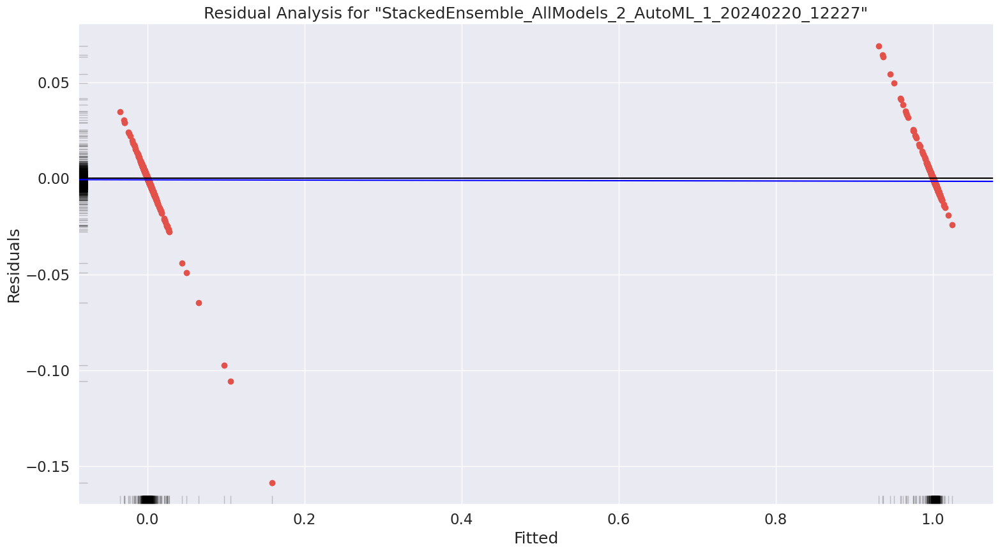

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

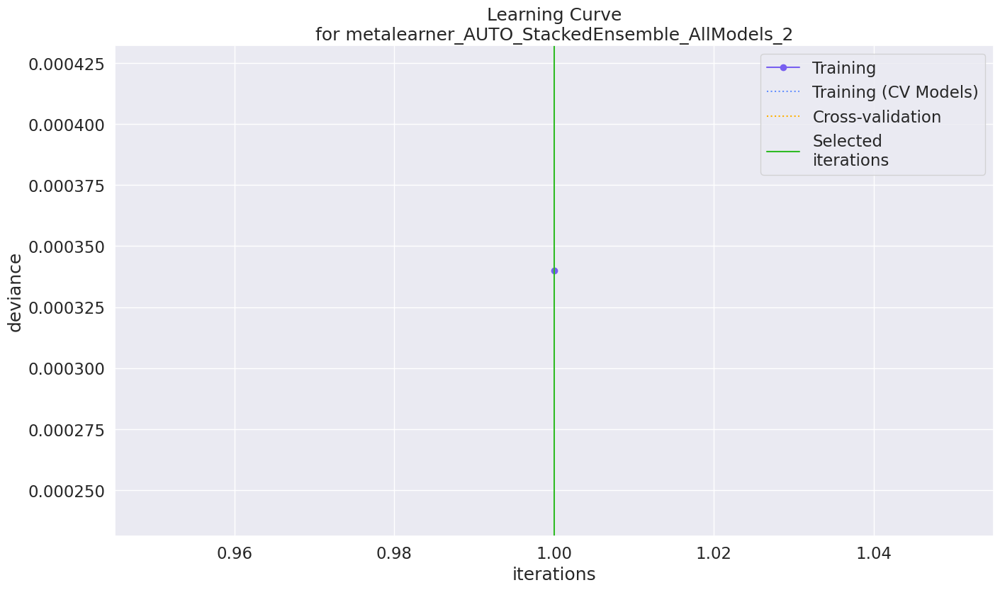

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

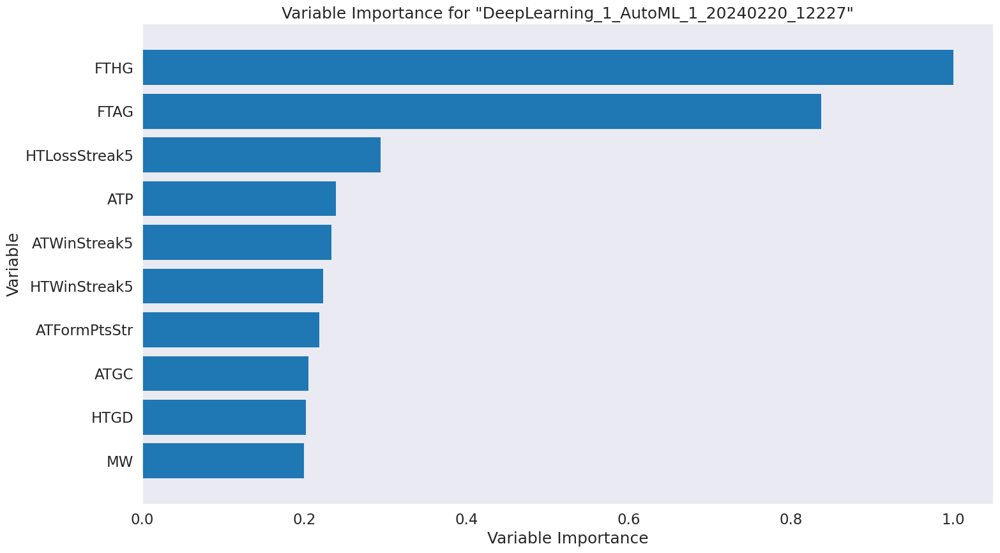

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

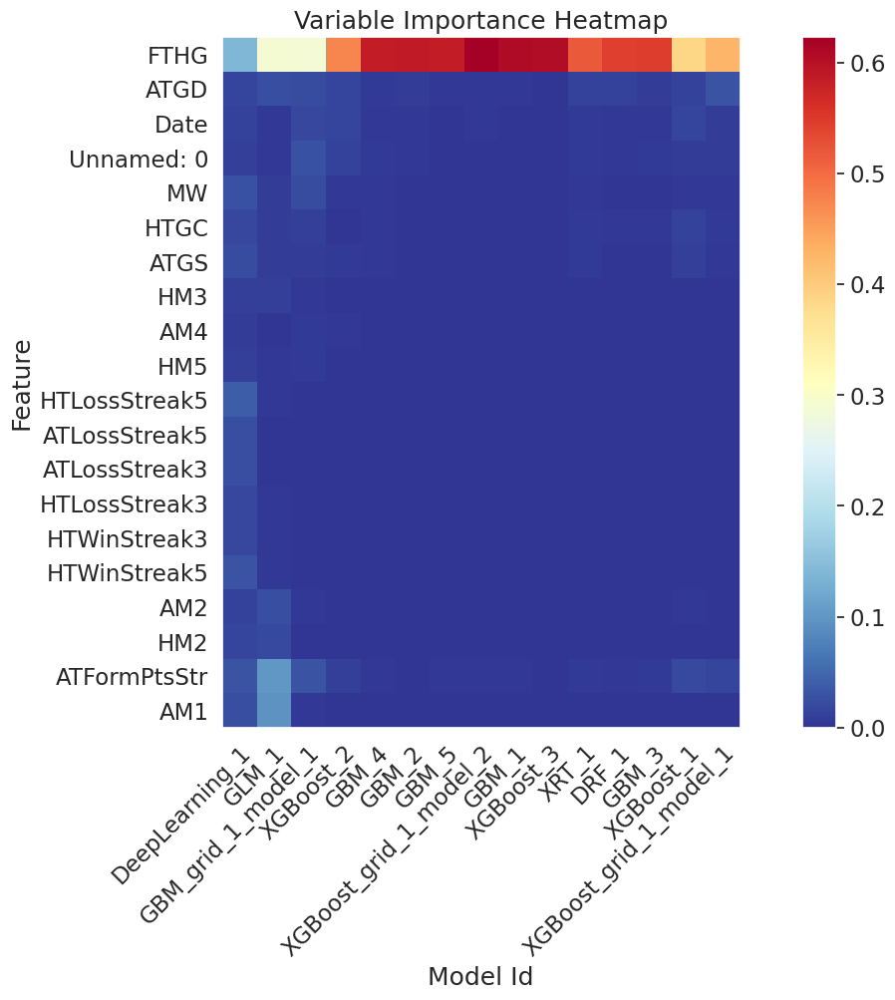

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

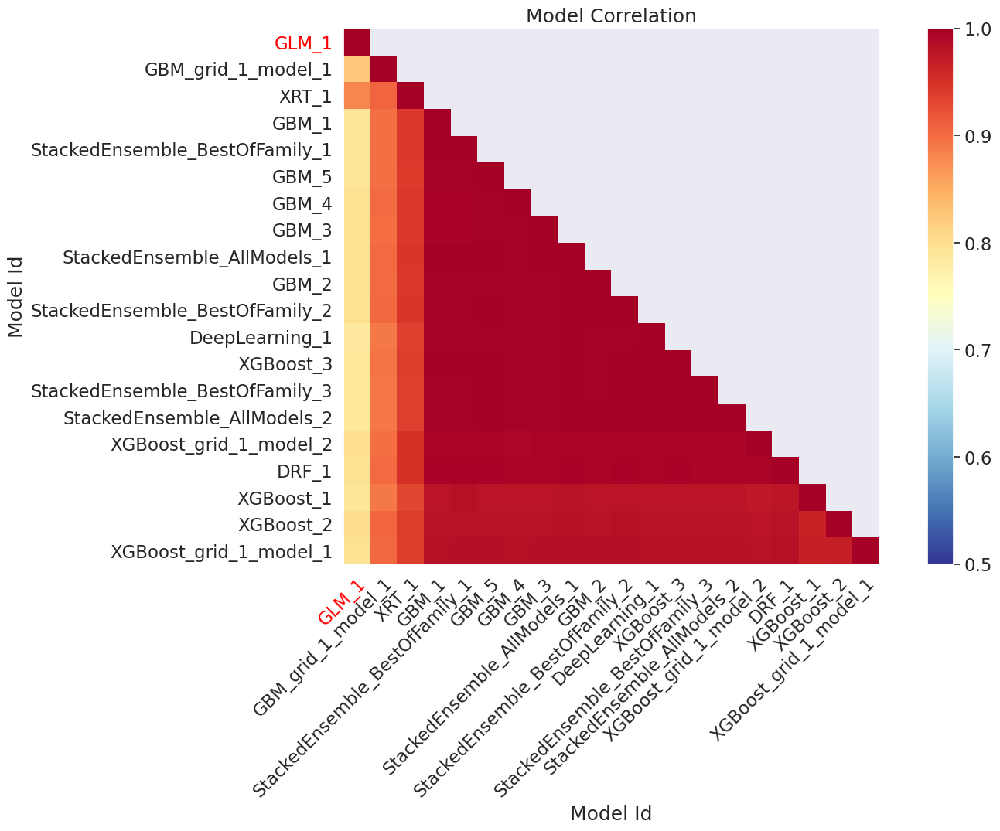

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

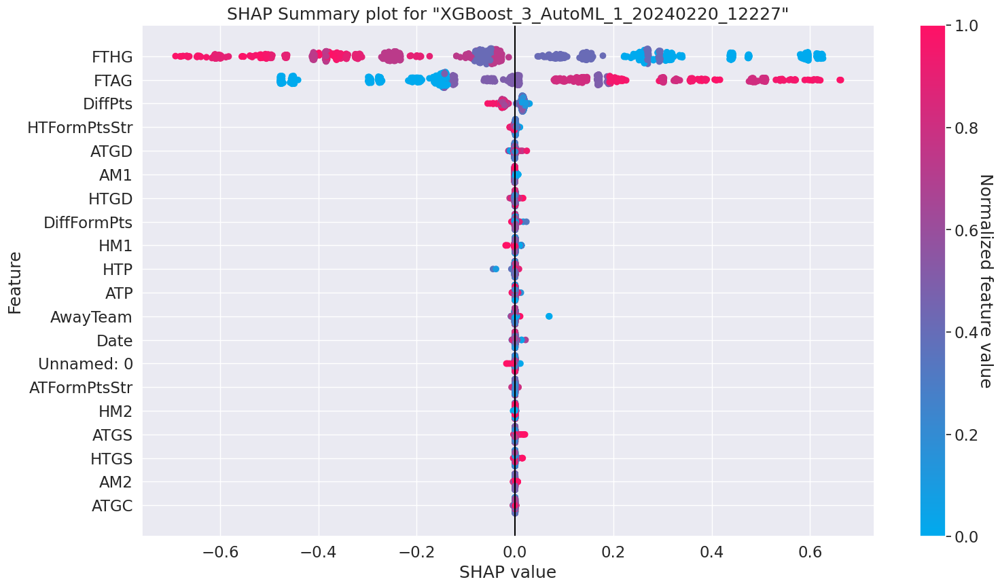

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

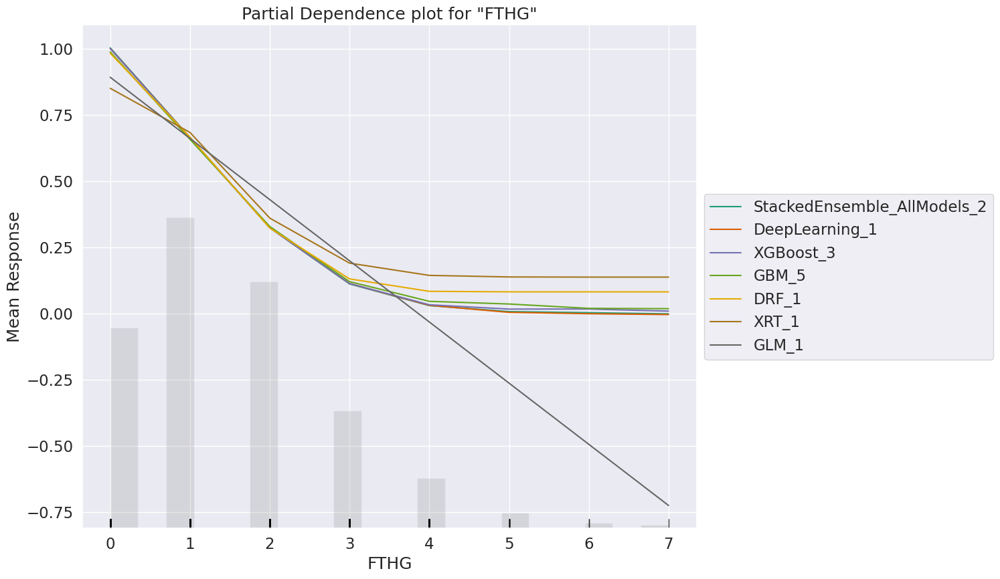

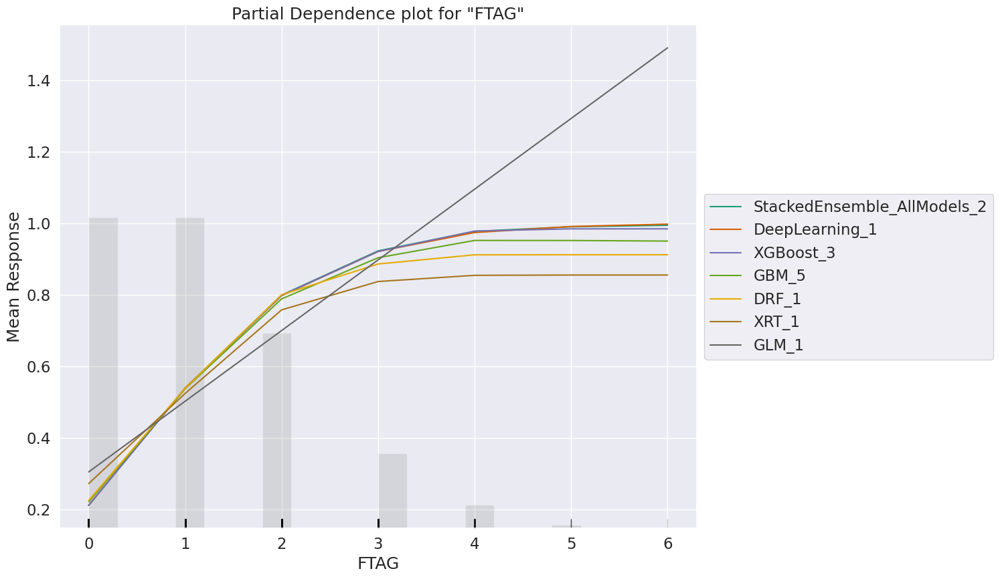

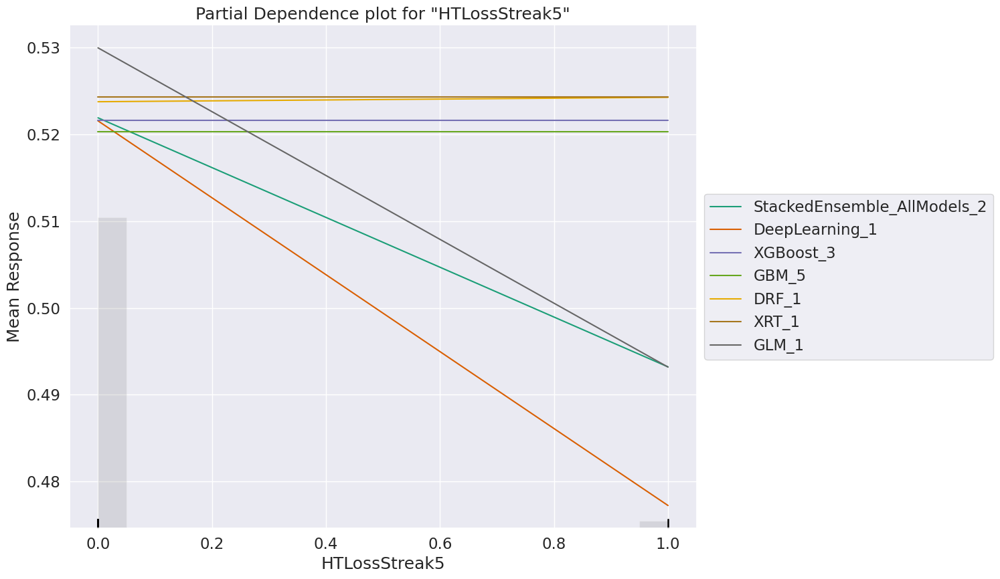

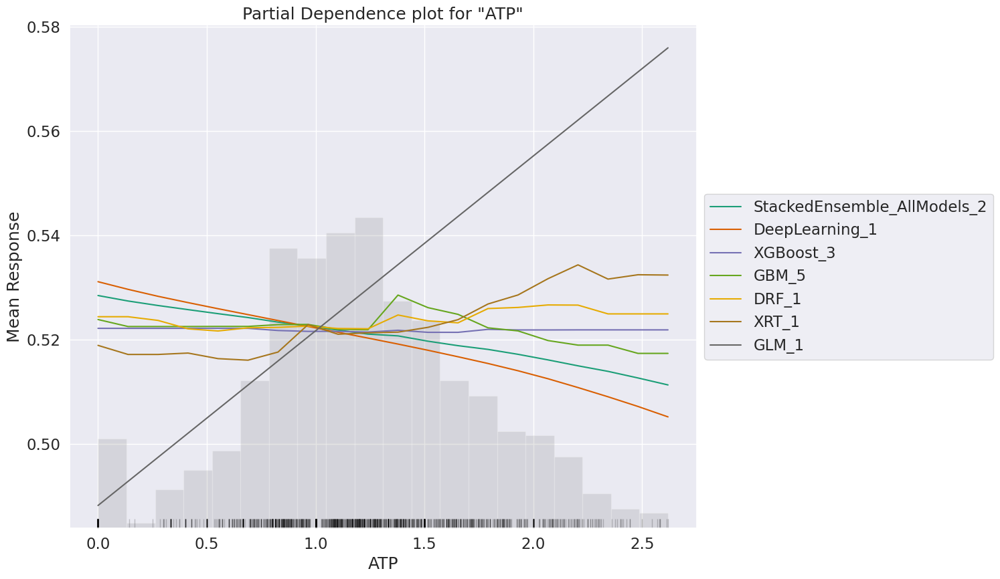

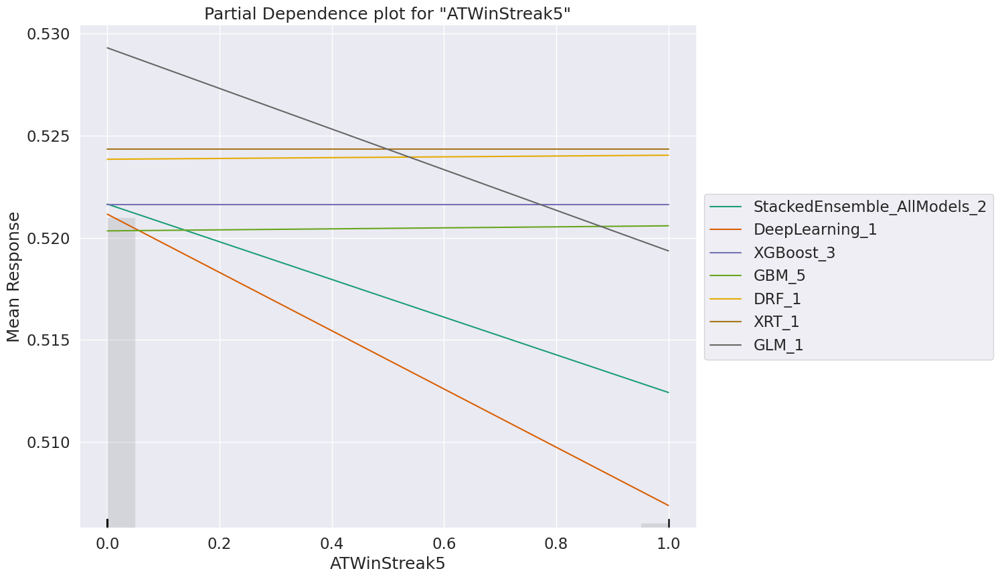

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

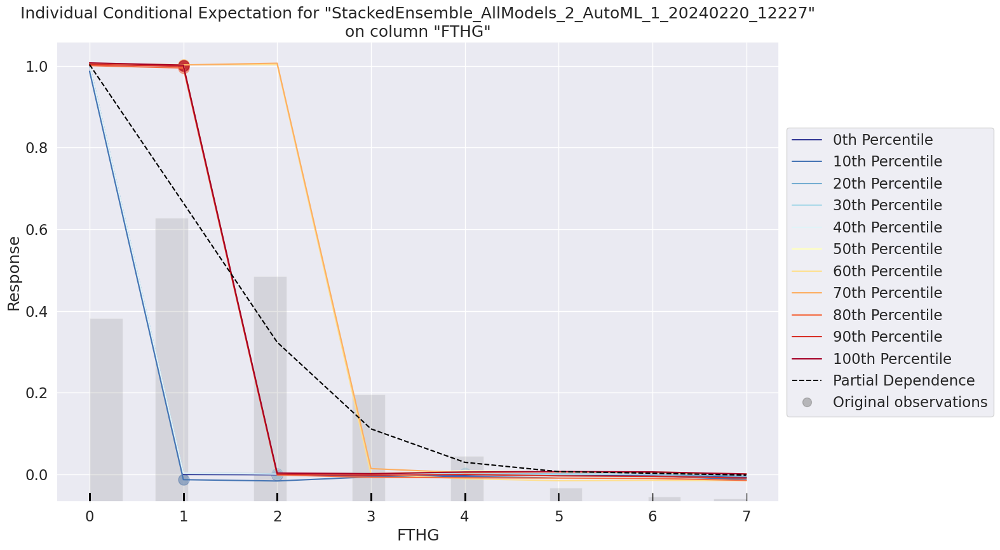

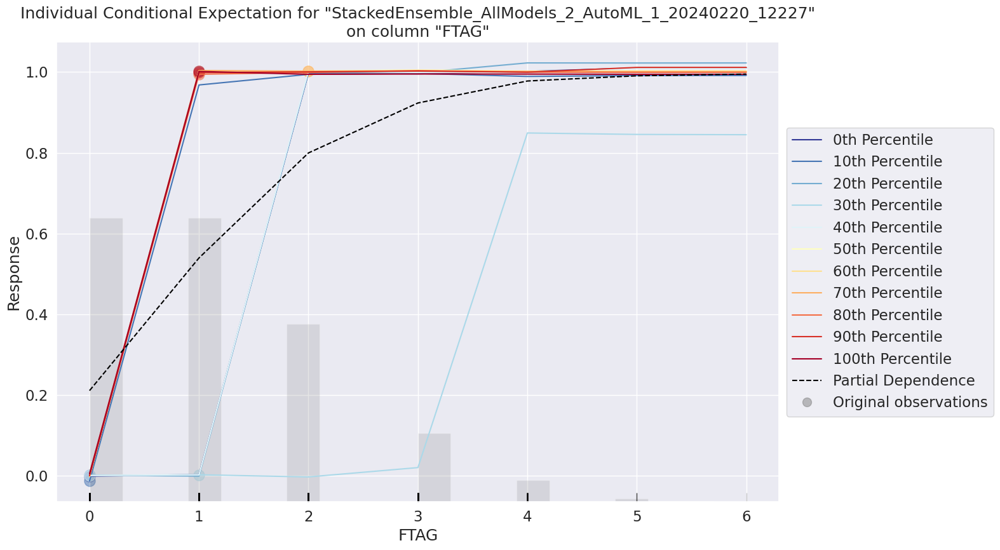

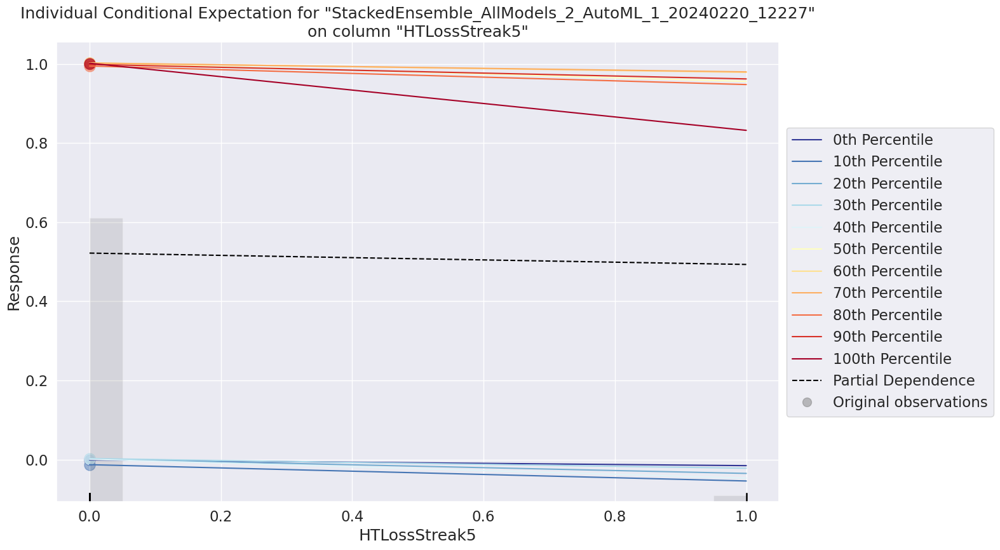

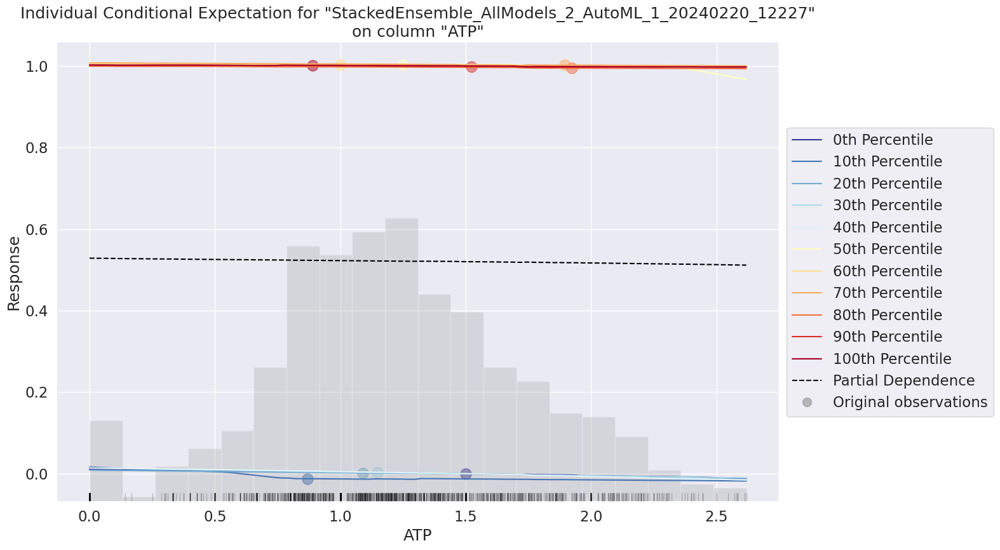

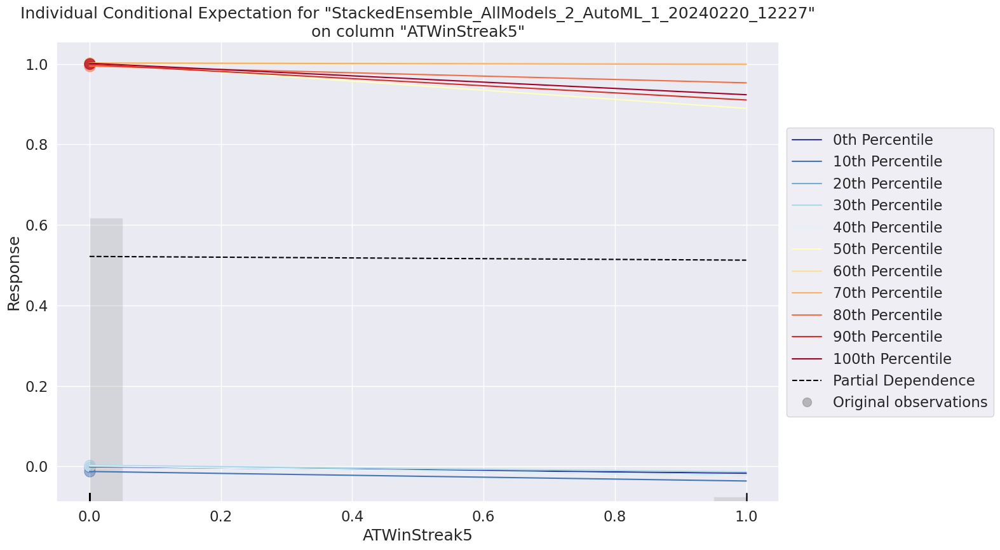

In [124]:
exa = aml.explain(df_test)

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_BestOfFamily_3_AutoML_1_20240220_12227,0.00970809,9.4247e-05,0.0046318,0.00808469,9.4247e-05,384,0.020757,StackedEnsemble
StackedEnsemble_AllModels_2_AutoML_1_20240220_12227,0.00973783,9.48254e-05,0.0047323,0.0081018,9.48254e-05,1121,0.153733,StackedEnsemble
DeepLearning_1_AutoML_1_20240220_12227,0.0110906,0.000123002,0.00440133,0.00884558,0.000123002,853,0.012506,DeepLearning
XGBoost_3_AutoML_1_20240220_12227,0.0186089,0.000346293,0.00648847,0.0156165,0.000346293,822,0.005621,XGBoost
StackedEnsemble_AllModels_1_AutoML_1_20240220_12227,0.0288371,0.000831576,0.0193874,0.0223854,0.000831576,894,0.238599,StackedEnsemble
StackedEnsemble_BestOfFamily_2_AutoML_1_20240220_12227,0.0327428,0.00107209,0.0239854,0.0250949,0.00107209,485,0.028887,StackedEnsemble
GBM_5_AutoML_1_20240220_12227,0.035555,0.00126416,0.0234662,0.0270902,0.00126416,1023,0.023973,GBM
GBM_2_AutoML_1_20240220_12227,0.0370085,0.00136963,0.0272754,0.0281874,0.00136963,2472,0.018641,GBM
StackedEnsemble_BestOfFamily_1_AutoML_1_20240220_12227,0.0403638,0.00162924,0.0217989,0.03207,0.00162924,875,0.086403,StackedEnsemble
GBM_1_AutoML_1_20240220_12227,0.0410175,0.00168244,0.0203465,0.0325002,0.00168244,11394,0.115534,GBM


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

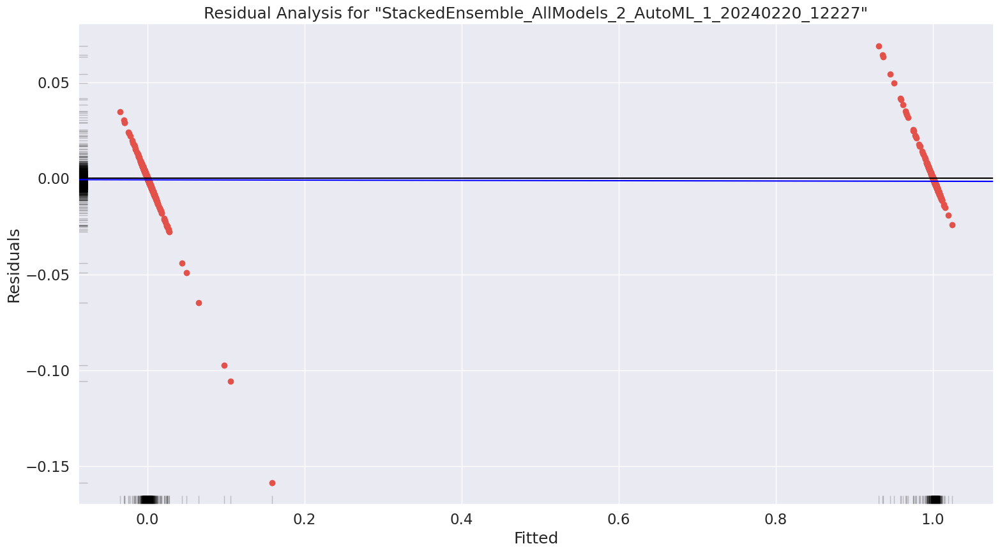

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

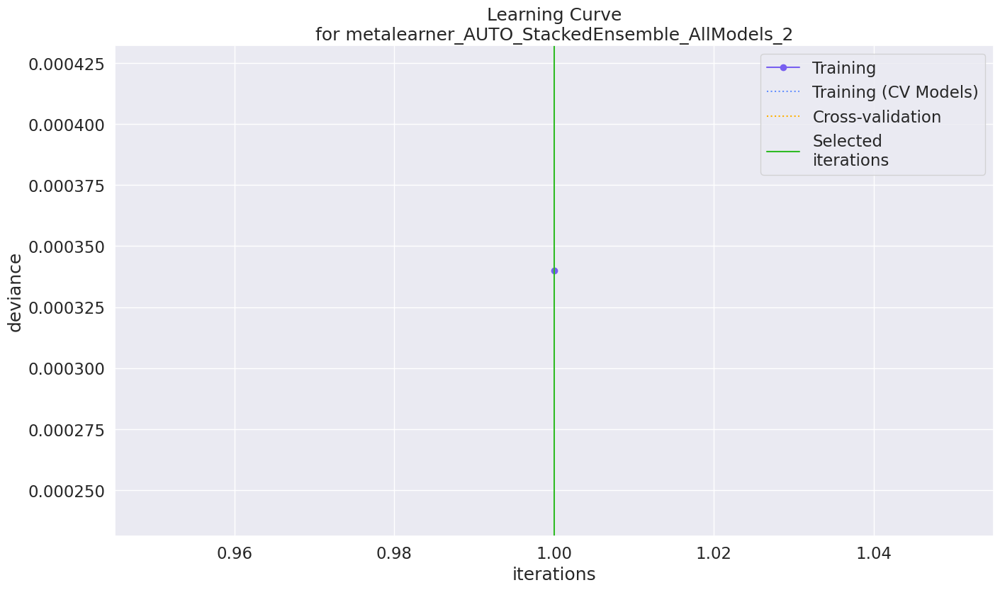

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

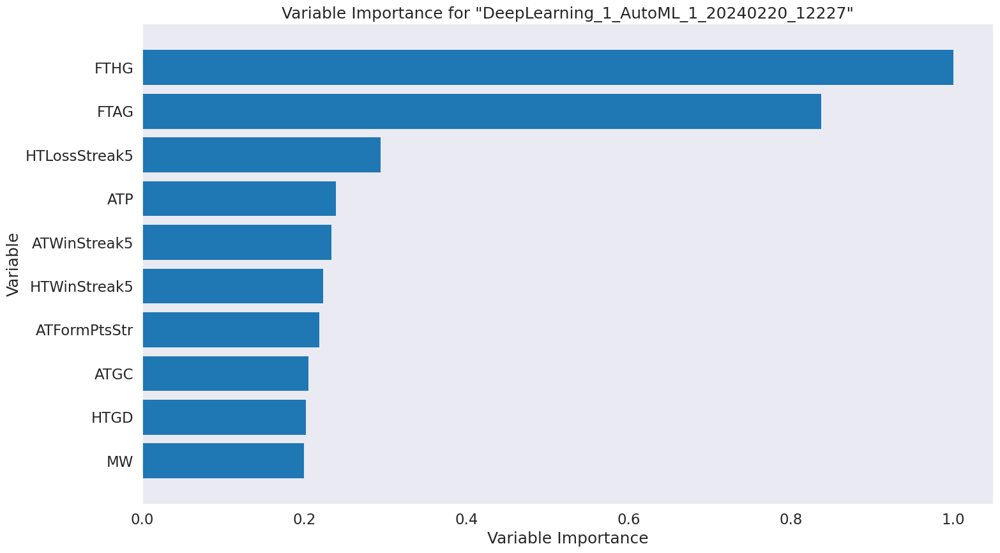

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

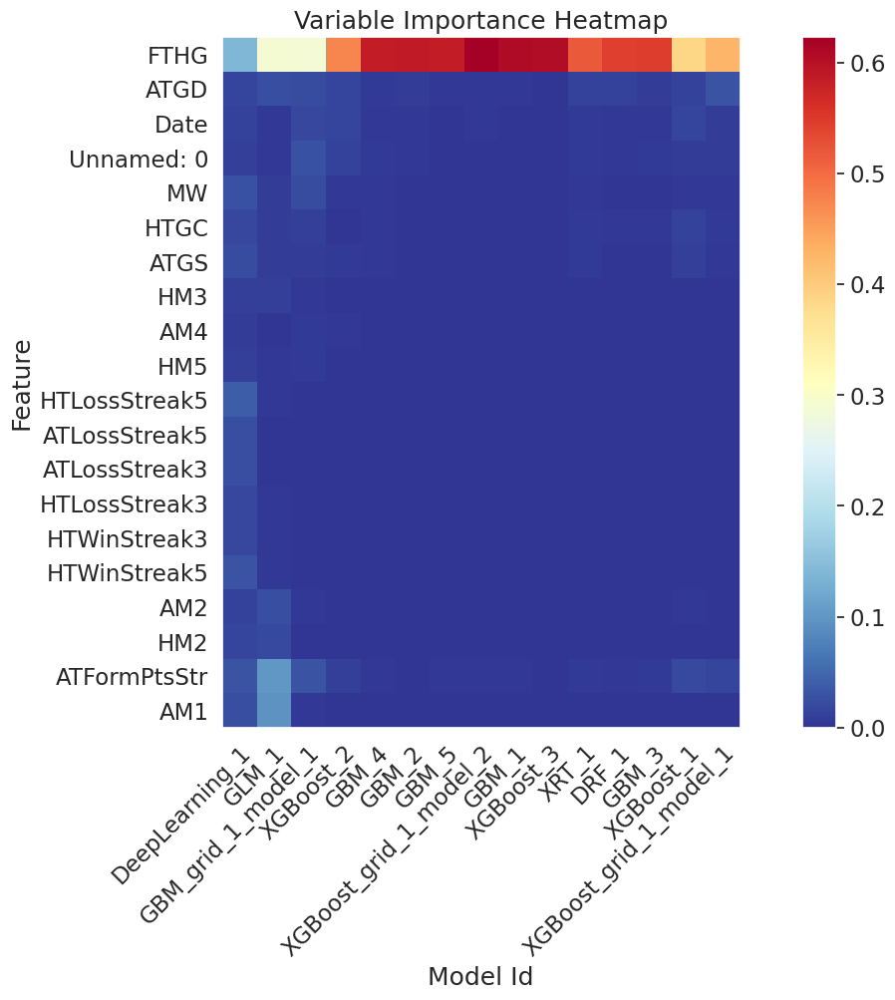

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

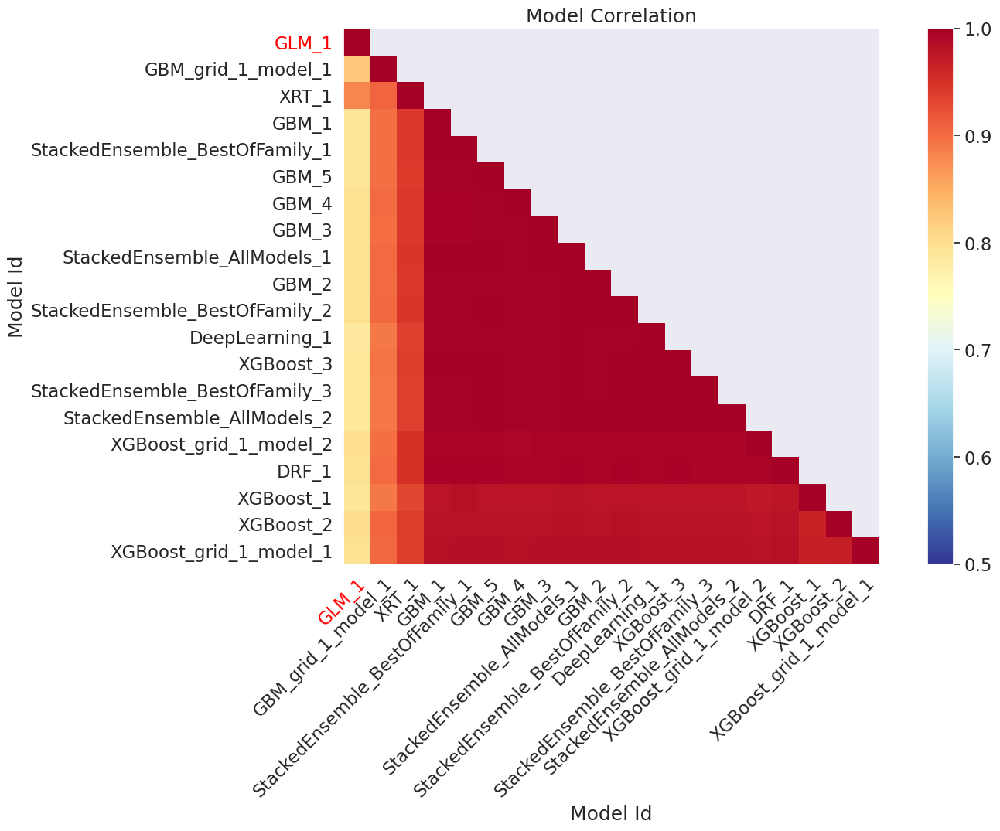

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

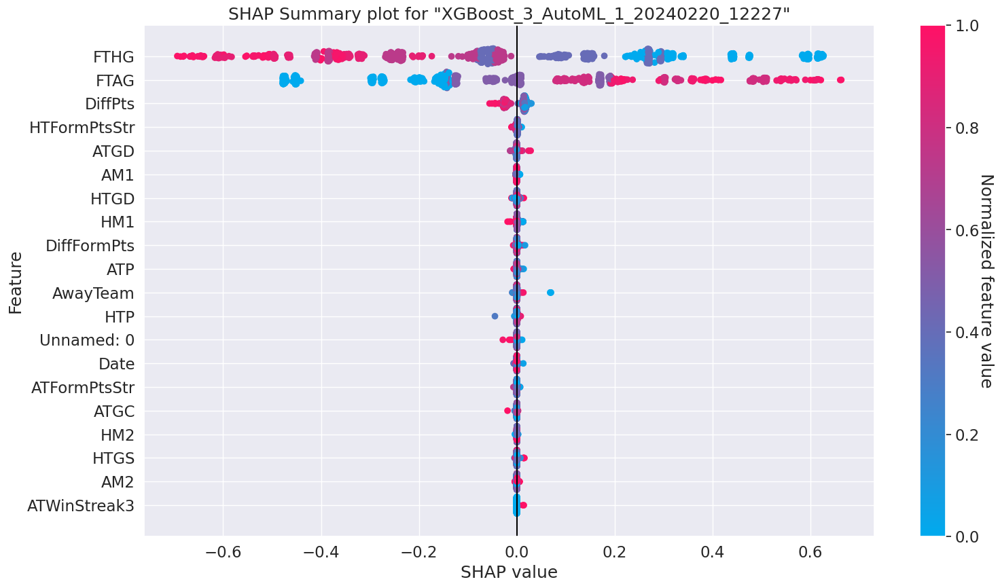

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

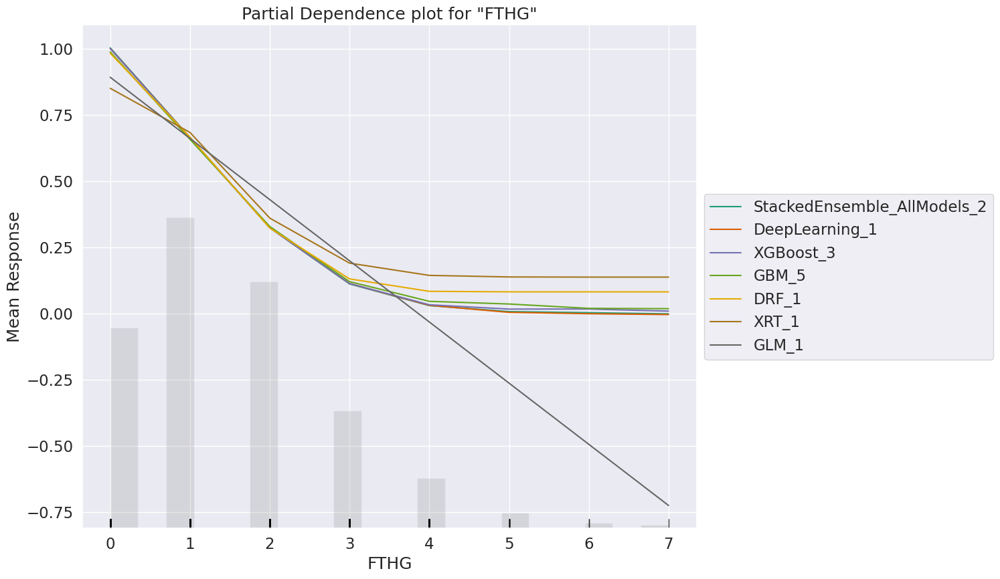

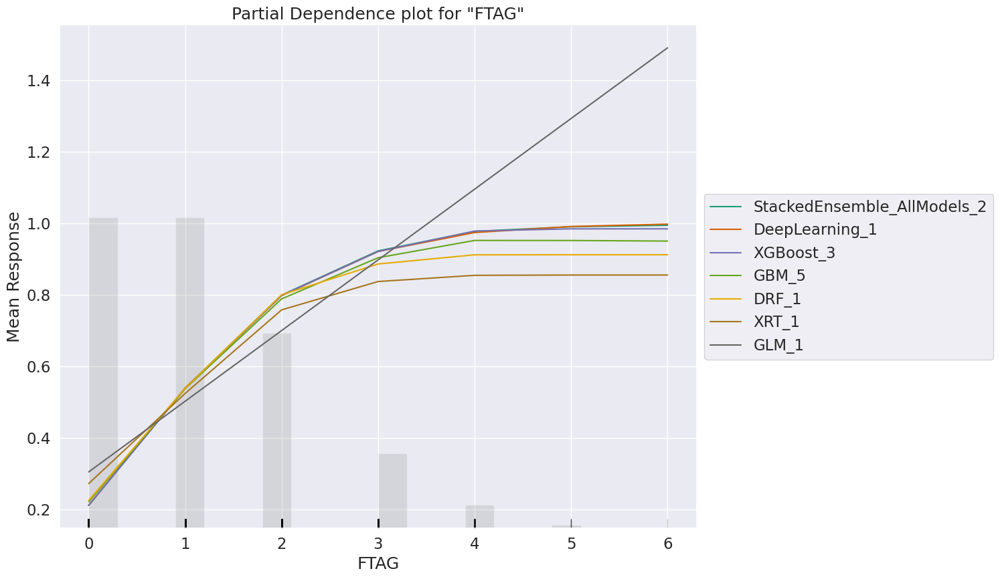

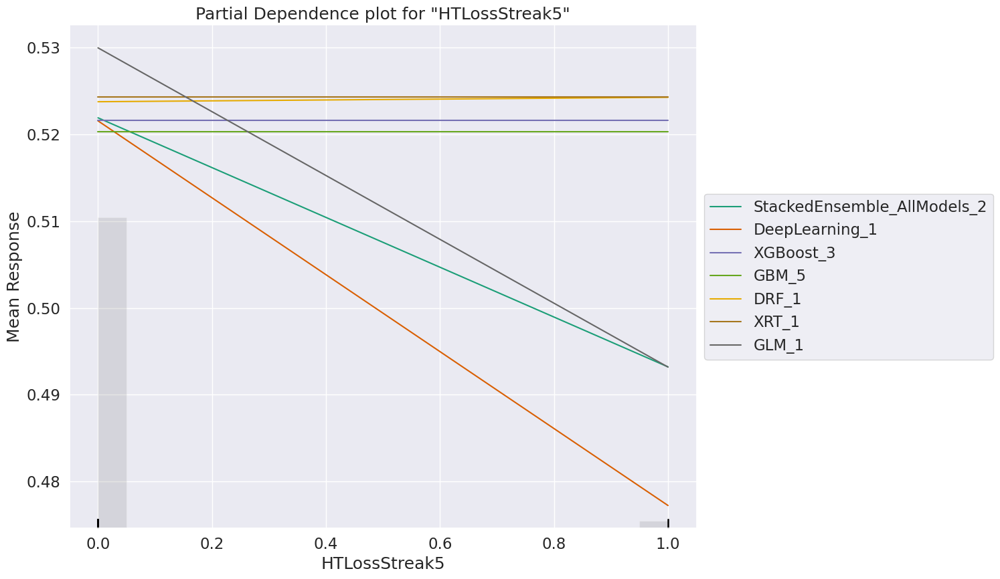

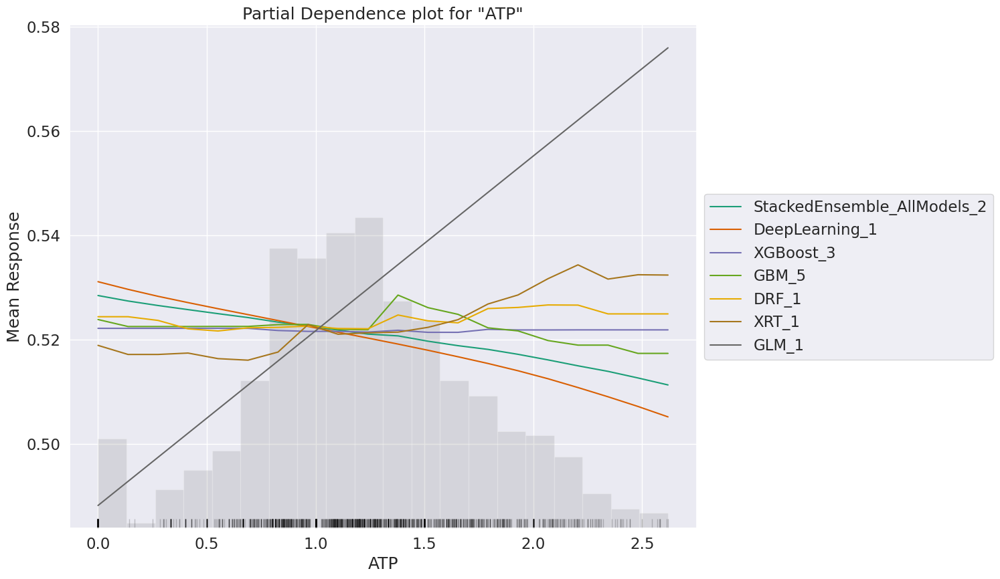

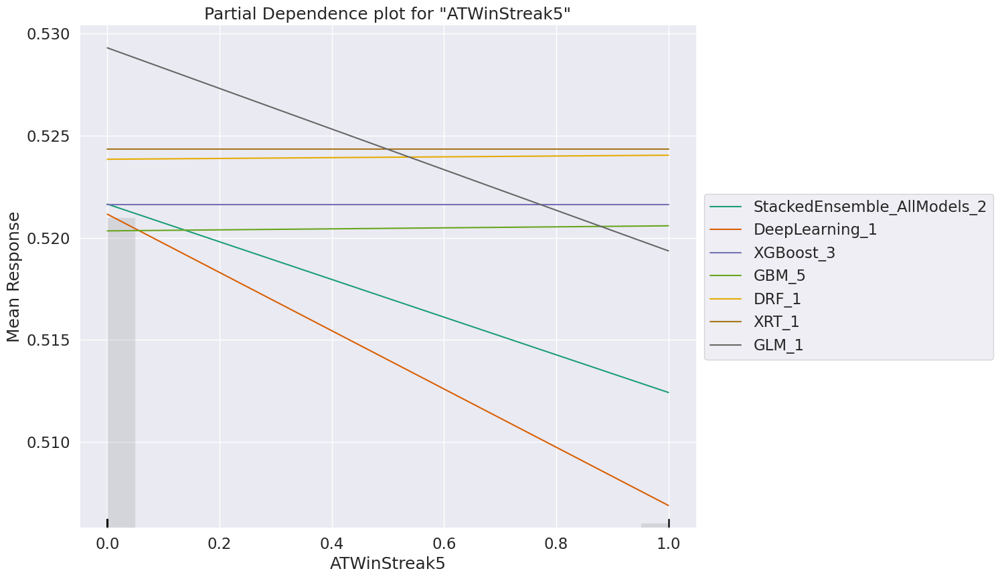

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

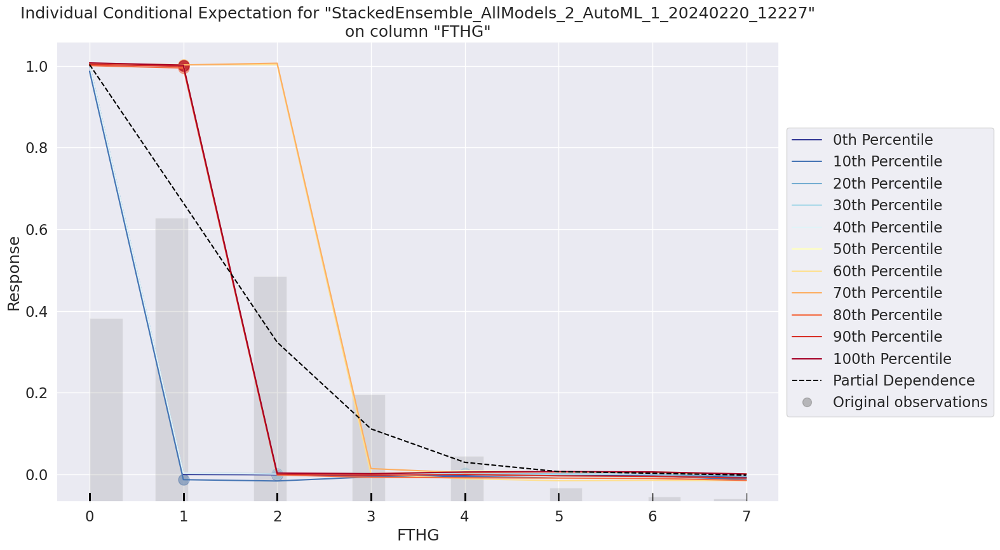

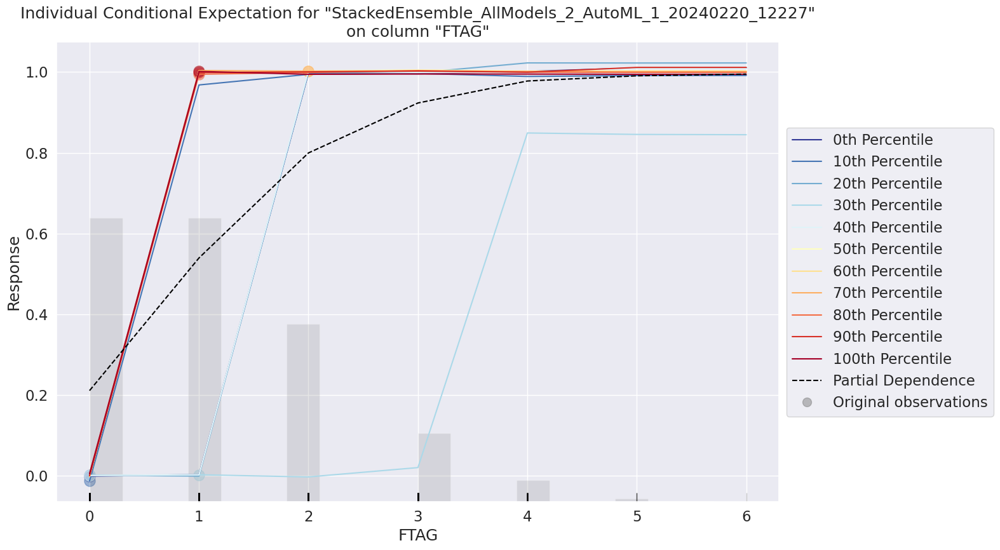

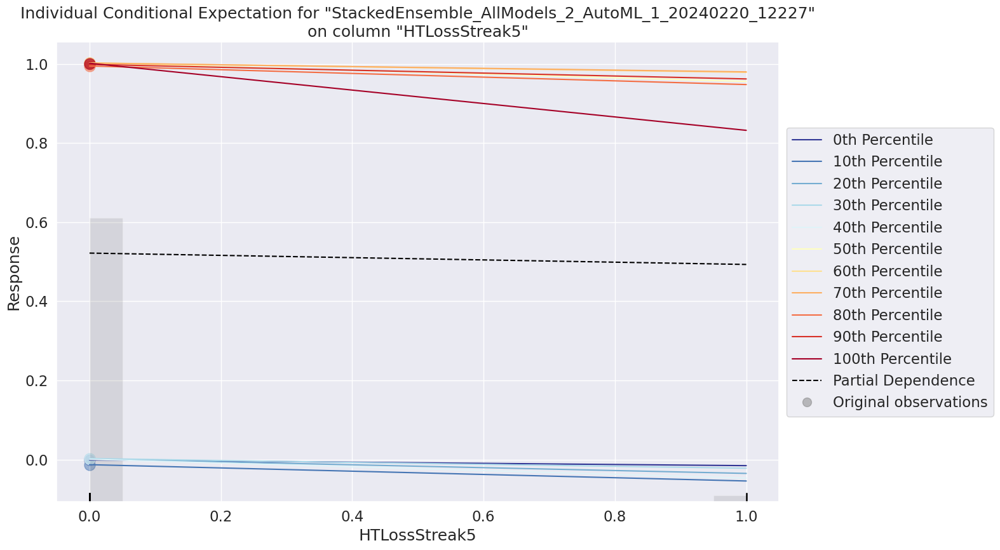

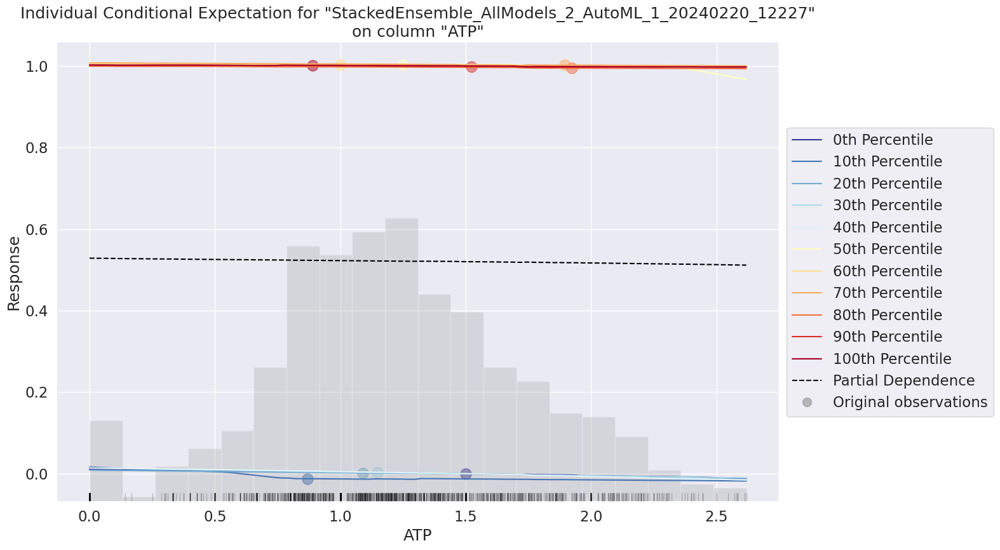

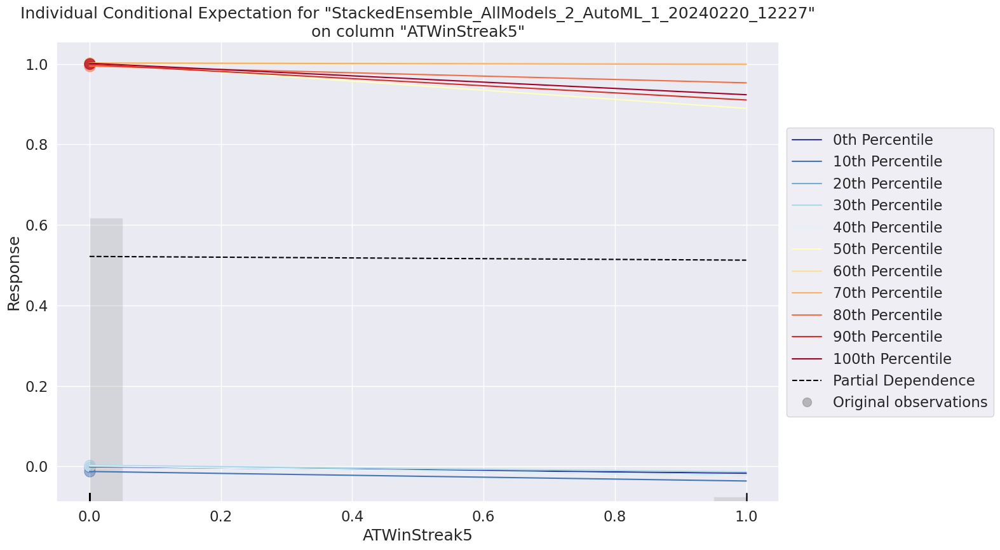

In [125]:
exa = aml.explain(df_test)

# Checking if assumptions violated

Checking if the model has violated any assumptions. For linear regression some of the assumptions are:

(1)There needs to be linear relation between the independent and dependent variable.

(2)Homoscedasticity which means normality of the error distribution.The plot for residuals against target variable should be normally distributed.

(3)Thirdly, linear regression assumes that there is little or no multicollinearity in the data. Multicollinearity occurs when the independent variables are too highly correlated with each other.

(4)There should be no or little auto correlation. One way to test this is by Durbin-Watson test. The values should be brtween 1.5-2.5 for no autocorrelation.

In [127]:
#Seperating the predictor and target variables
A=dff.drop(['FTR'],axis=1)
B=dff['FTR']

In [128]:
#Splitting the data
A_train,A_test,b_train,b_test=tts(A,B,test_size=0.2,random_state=42)

In [129]:

cols1 = ['HTGS','ATGS','HTGC','ATGC','HTP','ATP','HTGD','ATGD','DiffPts','DiffFormPts']
model1 = sm.OLS(b_train,sm.add_constant(A_train[cols1])).fit()

In [130]:
b_pred = model1.predict(sm.add_constant(A_train[cols1]))

In [131]:
residuals = b_train-b_pred
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals 1.745192684323053e-15


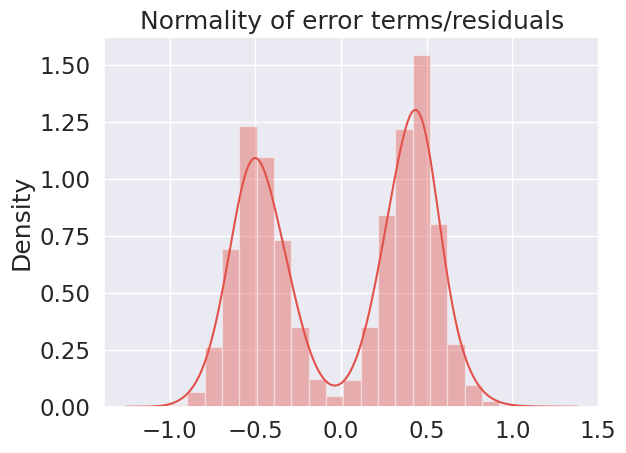

In [132]:
p = sns.distplot(residuals,kde=True)
p = plt.title('Normality of error terms/residuals')

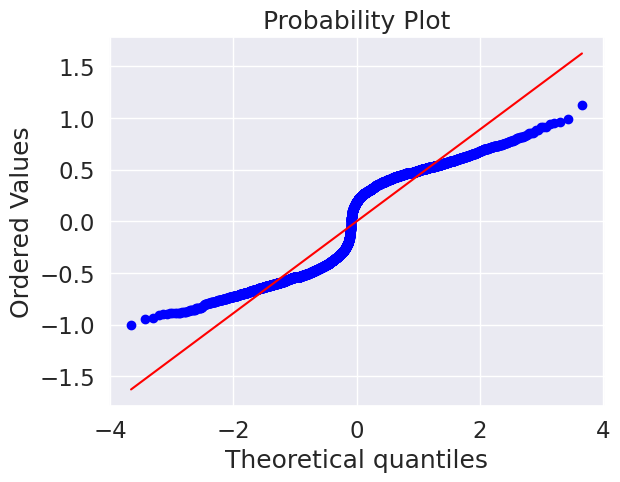

In [133]:
import pylab
import scipy.stats as stats
stats.probplot(residuals, dist="norm", plot=pylab)
pylab.show()

<Axes: xlabel='FTR', ylabel='Count'>

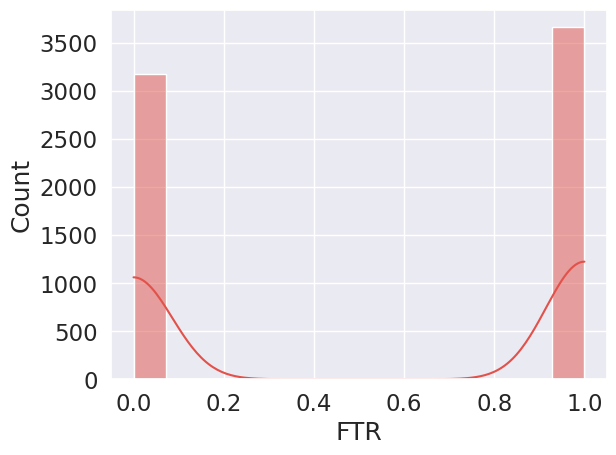

In [135]:
sns.histplot(dff.FTR, kde = True)

# Analysing relation between all variables

VIF stands for Variance Inflation Factor.It signifies multicollinearity among set of different independent variable. A value greater than 10 means that the independent variable is highly correlated with some other variable. Will calculate VIF value for all variables to check the dependency and then will drop the variables with high VIF value.


In [136]:
import statsmodels.formula.api as smf  # OLS model Library

In [138]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
#Indicate which variables to compute VIF
Multic = dff[['HTGS','ATGS','HTGC','ATGC','HTP','ATP','HTGD','ATGD','DiffPts','DiffFormPts']]
#Compute VIF
vif = pd.DataFrame()
vif["variables"] = Multic.columns
vif["VIF"] = [variance_inflation_factor(Multic.values, i) for i in range(Multic.shape[1])]
vif

,variables,VIF
0,HTGS,27.083527
1,ATGS,27.557692
2,HTGC,30.138897
3,ATGC,30.404832
4,HTP,inf
5,ATP,inf
6,HTGD,6.786647
7,ATGD,6.862551
8,DiffPts,inf
9,DiffFormPts,4.346425


In [139]:
import h2o

pandas_df = h2o.as_list(df)

Export File progress: |██████████████████████████████████████████████████████████| (done) 100%


Ordinary least squares (OLS) regression is a statistical method of analysis used for multivariate model that estimates the relationship between one or more independent variables and a dependent variable; the method estimates the relationship by minimizing the sum of the squares in the difference between the observed and predicted values of the dependent variable.

In [140]:
results = smf.ols(
    "FTR ~ HTGS + ATGS + HTGC + HTP + ATP + HTGD + ATGD + DiffPts + DiffFormPts" ,
    data=pandas_df,
).fit()

results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                    FTR   R-squared:                       0.104
Model:                            OLS   Adj. R-squared:                  0.103
Method:                 Least Squares   F-statistic:                     99.07
Date:                Tue, 20 Feb 2024   Prob (F-statistic):          1.12e-156
Time:                        01:57:35   Log-Likelihood:                -4571.5
No. Observations:                6840   AIC:                             9161.
Df Residuals:                    6831   BIC:                             9223.
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.5450      0.027     20.287      0.000       0.492       0.598
HTGS           -0.0054      0.001     -5.400      0.000      -0.007      -0.003
ATGS            0.0032      0.001      3.678      0.000       0.002       0.005
HTGC            0.0015      0.001      1.597      0.110      -0.000       0.003
HTP            -0.0206      0.015     -1.345      0.179      -0.051       0.009
ATP             0.0230      0.016      1.480      0.139      -0.007       0.053
HTGD           -0.0542      0.023     -2.407      0.016      -0.098      -0.010
ATGD            0.0776      0.019      4.010      0.000       0.040       0.116
DiffPts        -0.0436      0.018     -2.412      0.016      -0.079      -0.008
DiffFormPts    -0.0006      0.026     -0.025      0.980      -0.051       0.050
==============================================================================
Omnibus:                    34612.263   Durbin-Watson:                   1.999
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              742.031
Skew:                          -0.130   Prob(JB):                    7.41e-162
Kurtosis:                       1.408   Cond. No.                     2.11e+17
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 3.82e-28. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

**Re-executing AutoML with Reduced columns**

Removing [HTP, ATP, DiffPts, DiffFormPts]

In [150]:
reduced_data = df.drop(['HTP', 'ATP', 'DiffPts', 'DiffFormPts'], axis=1)

# Display the first few rows of the updated dataset to confirm the changes
reduced_data.head()

Unnamed: 0,Date,HomeTeam,AwayTeam,FTHG,FTAG,FTR,HTGS,ATGS,HTGC,ATGC,HM1,HM2,HM3,HM4,HM5,AM1,AM2,AM3,AM4,AM5,MW,HTFormPtsStr,ATFormPtsStr,HTFormPts,ATFormPts,HTWinStreak3,HTWinStreak5,HTLossStreak3,HTLossStreak5,ATWinStreak3,ATWinStreak5,ATLossStreak3,ATLossStreak5,HTGD,ATGD
0,1065,11,24,4,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0
1,1065,12,41,4,2,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0
2,1065,13,27,1,3,1,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0
3,1065,15,34,2,2,1,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0
4,1065,21,16,2,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0
5,1065,22,1,0,0,1,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0
6,1065,23,7,1,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0
7,1065,36,0,1,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0
8,1065,38,20,3,1,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0
9,1126,25,28,2,0,0,0,0,0,0,2,2,2,2,2,2,2,2,2,2,1,230,240,0,0,0,0,0,0,0,0,0,0,0,0


In [151]:
hf1 = h2o.H2OFrame(reduced_data)

In [152]:
train1, valid1, test1 = hf1.split_frame(ratios=[.7, .15], seed=1234)
# Summary of the split
print("Training set:", train1.shape)
print("Validation set:", valid1.shape)
print("Test set:", test1.shape)

Training set: (4798, 36)
Validation set: (1013, 36)
Test set: (1029, 36)


In [153]:
from h2o.automl import H2OAutoML

# Define X (features) and y (target)
y1 = 'FTR'
X1 = hf.columns
X1.remove(y1)

X1.remove('HTP')  # Ensuring there are no removed columns in the new features
X1.remove('ATP')
X1.remove('DiffPts')
X1.remove('DiffFormPts')

# Run AutoML
# Run AutoML for 10 base models (limited to 1 hour max runtime by default)
aml1 = H2OAutoML(max_models=10, seed=1234)
aml1.train(x=X1, y=y1, training_frame=train1, validation_frame=valid1, leaderboard_frame=test1)

AutoML progress: |
02:31:06.226: User specified a validation frame with cross-validation still enabled. Please note that the models will still be validated using cross-validation only, the validation frame will be used to provide purely informative validation metrics on the trained models.
02:31:06.250: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

██
02:31:19.322: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.


02:31:20.402: _response param, We have detected that your response column has only 2 unique values (0/1). If you wish to train a binary model instead of a regression model, convert your target column to categorical before training.

████
0

key,value
Stacking strategy,cross_validation
Number of base models (used / total),7/10
# GBM base models (used / total),4/4
# XGBoost base models (used / total),3/3
# DRF base models (used / total),0/2
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5
Metalearner fold_column,None


In [154]:
#View all models
leaderboard1 = aml1.leaderboard
leaderboard1.head()

model_id,rmse,mse,mae,rmsle,mean_residual_deviance
StackedEnsemble_AllModels_1_AutoML_2_20240220_23106,0.0335015,0.00112235,0.0151345,0.0261929,0.00112235
StackedEnsemble_BestOfFamily_1_AutoML_2_20240220_23106,0.0336912,0.0011351,0.0154076,0.0264858,0.0011351
GBM_2_AutoML_2_20240220_23106,0.0364181,0.00132628,0.0172848,0.0279132,0.00132628
GBM_1_AutoML_2_20240220_23106,0.0391905,0.00153589,0.0172156,0.0305599,0.00153589
XGBoost_3_AutoML_2_20240220_23106,0.0400655,0.00160524,0.0204125,0.0317725,0.00160524
XGBoost_2_AutoML_2_20240220_23106,0.0428827,0.00183893,0.0239616,0.0337149,0.00183893
GBM_3_AutoML_2_20240220_23106,0.0471174,0.00222005,0.0285266,0.0350757,0.00222005
GBM_4_AutoML_2_20240220_23106,0.0474725,0.00225364,0.0288653,0.0364878,0.00225364
DRF_1_AutoML_2_20240220_23106,0.0604132,0.00364976,0.0303013,0.0454926,0.00364976
XGBoost_1_AutoML_2_20240220_23106,0.094462,0.00892306,0.0720458,0.0712163,0.00892306


# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_AllModels_1_AutoML_2_20240220_23106,0.0335015,0.00112235,0.0151345,0.0261929,0.00112235,3796,0.182314,StackedEnsemble
StackedEnsemble_BestOfFamily_1_AutoML_2_20240220_23106,0.0336912,0.0011351,0.0154076,0.0264858,0.0011351,1445,0.035734,StackedEnsemble
GBM_2_AutoML_2_20240220_23106,0.0364181,0.00132628,0.0172848,0.0279132,0.00132628,1695,0.025883,GBM
GBM_1_AutoML_2_20240220_23106,0.0391905,0.00153589,0.0172156,0.0305599,0.00153589,10129,0.103136,GBM
XGBoost_3_AutoML_2_20240220_23106,0.0400655,0.00160524,0.0204125,0.0317725,0.00160524,1027,0.006108,XGBoost
XGBoost_2_AutoML_2_20240220_23106,0.0428827,0.00183893,0.0239616,0.0337149,0.00183893,2642,0.007391,XGBoost
GBM_3_AutoML_2_20240220_23106,0.0471174,0.00222005,0.0285266,0.0350757,0.00222005,2102,0.027508,GBM
GBM_4_AutoML_2_20240220_23106,0.0474725,0.00225364,0.0288653,0.0364878,0.00225364,4465,0.030354,GBM
DRF_1_AutoML_2_20240220_23106,0.0604132,0.00364976,0.0303013,0.0454926,0.00364976,1717,0.011479,DRF
XGBoost_1_AutoML_2_20240220_23106,0.094462,0.00892306,0.0720458,0.0712163,0.00892306,1784,0.012006,XGBoost


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

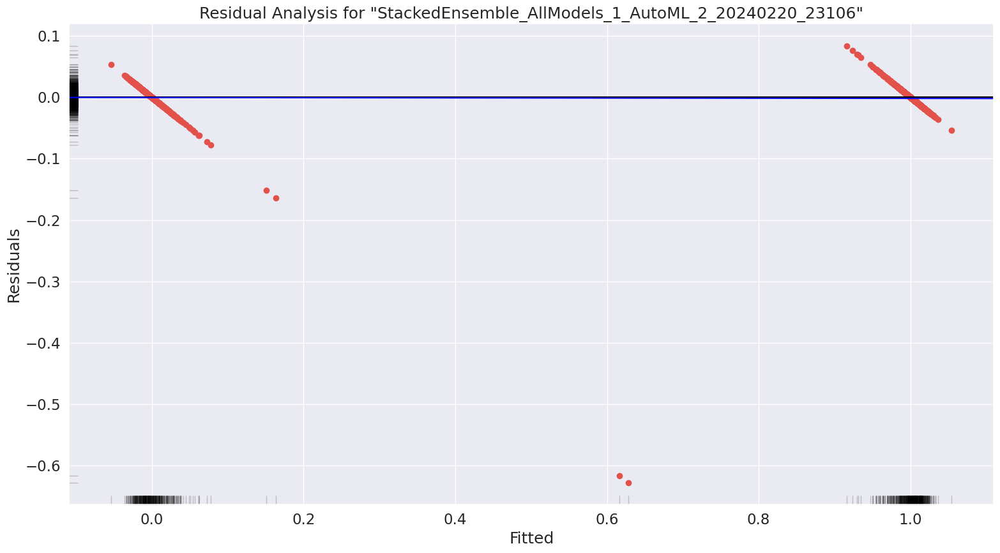

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

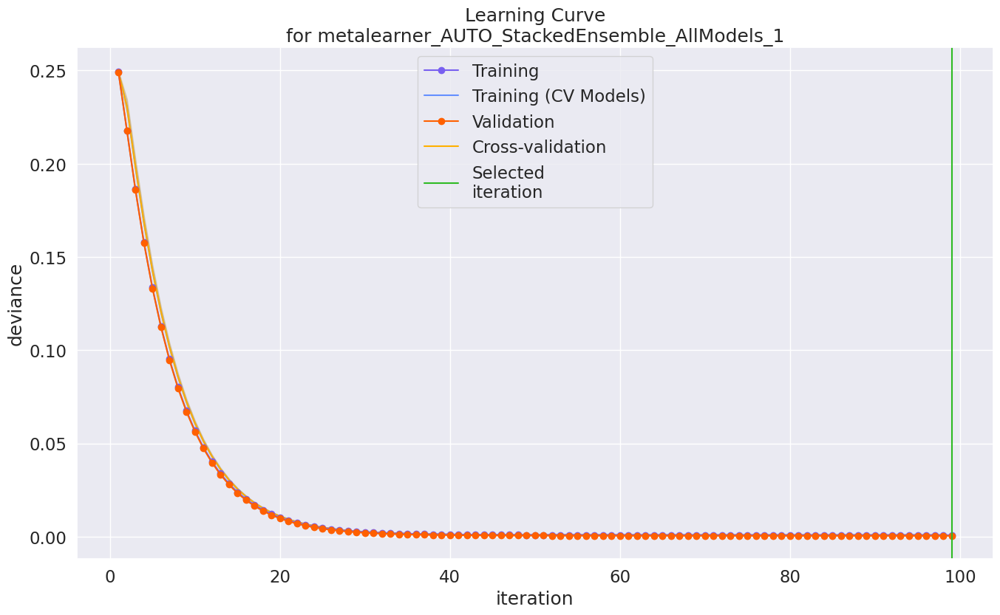

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

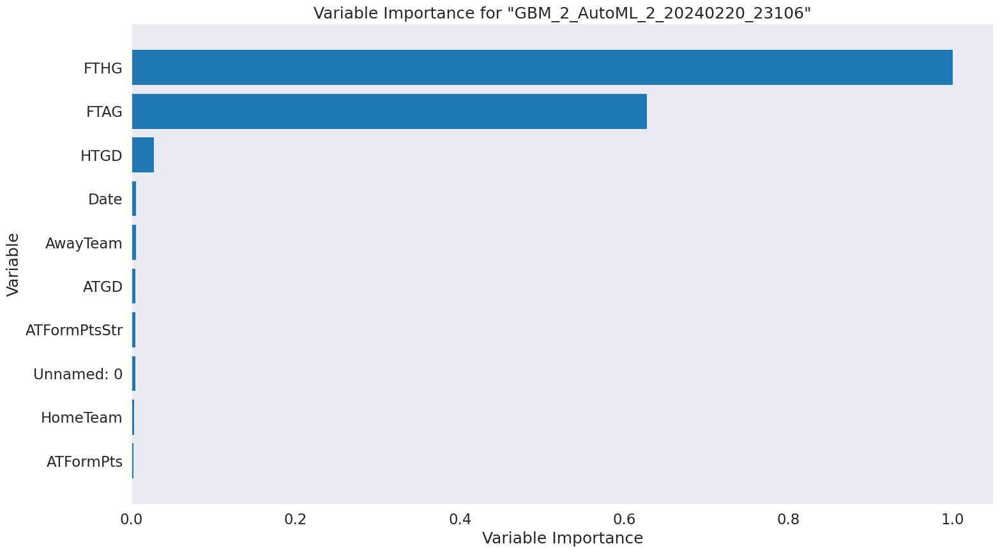

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

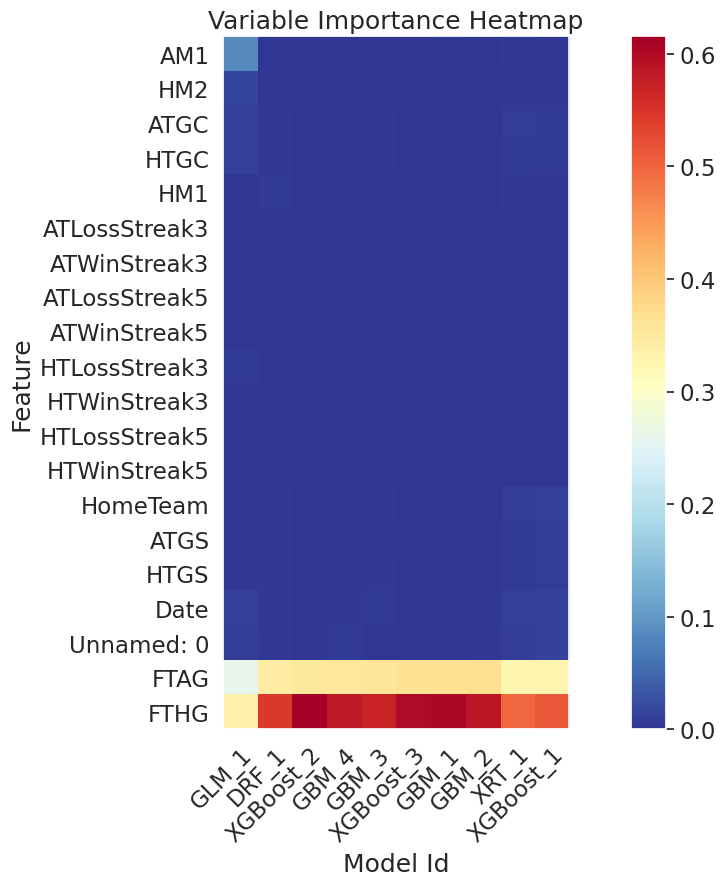

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

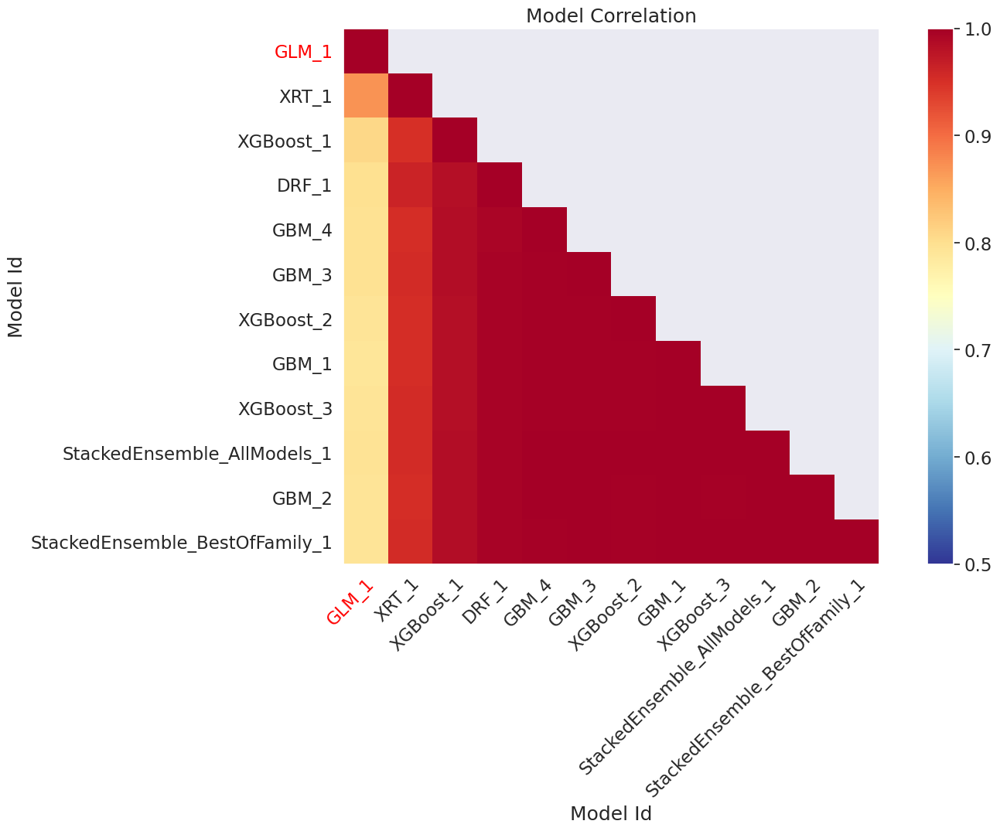

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

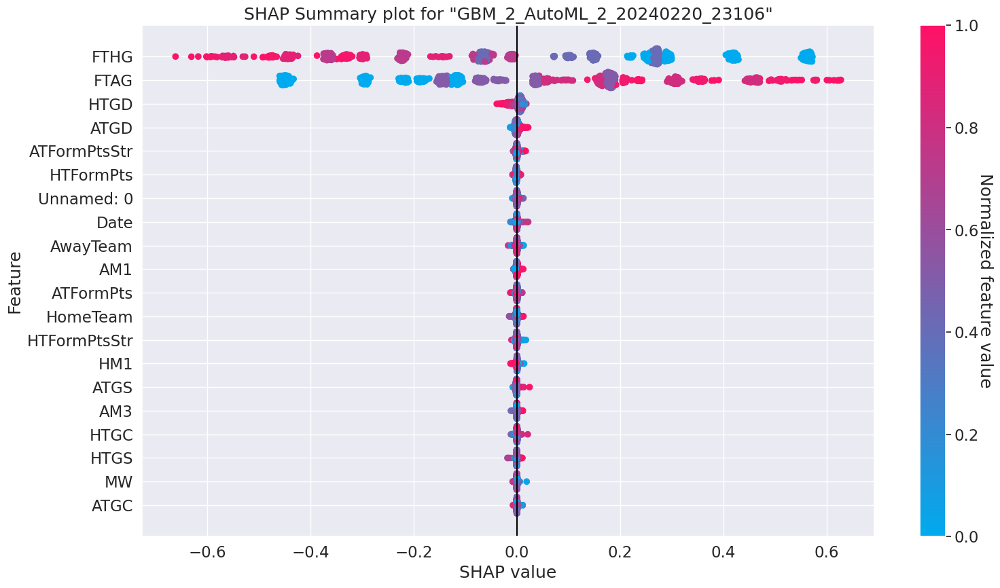

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

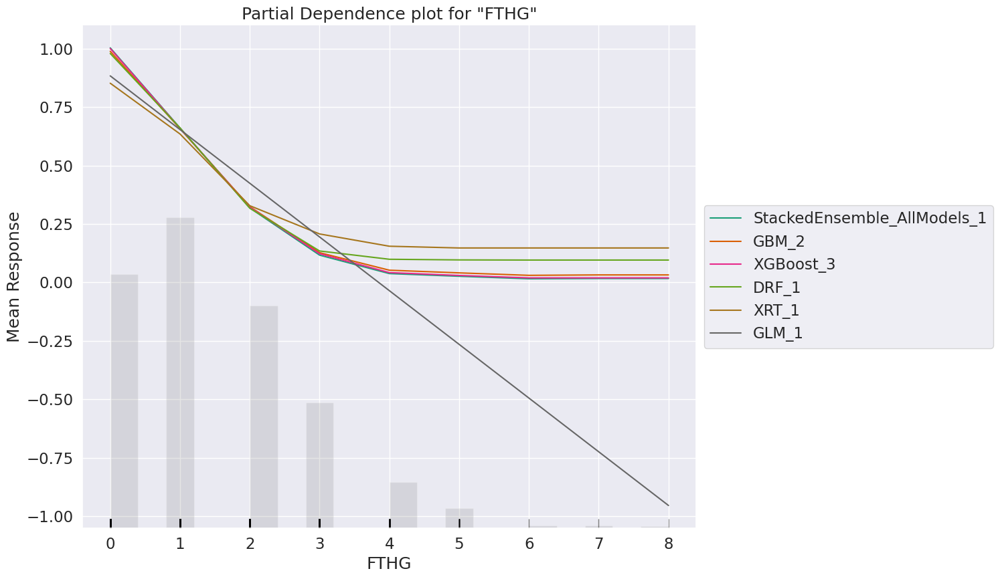

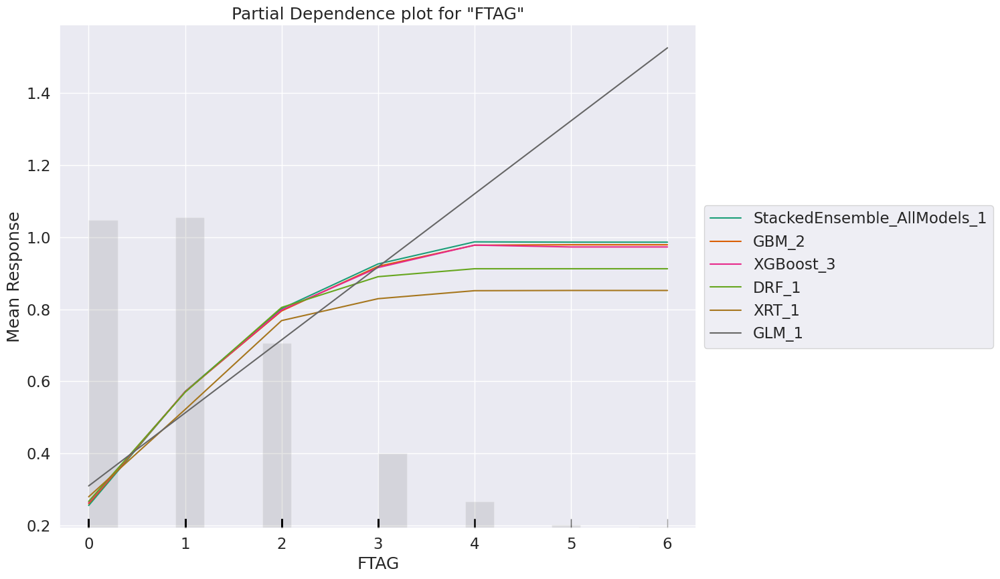

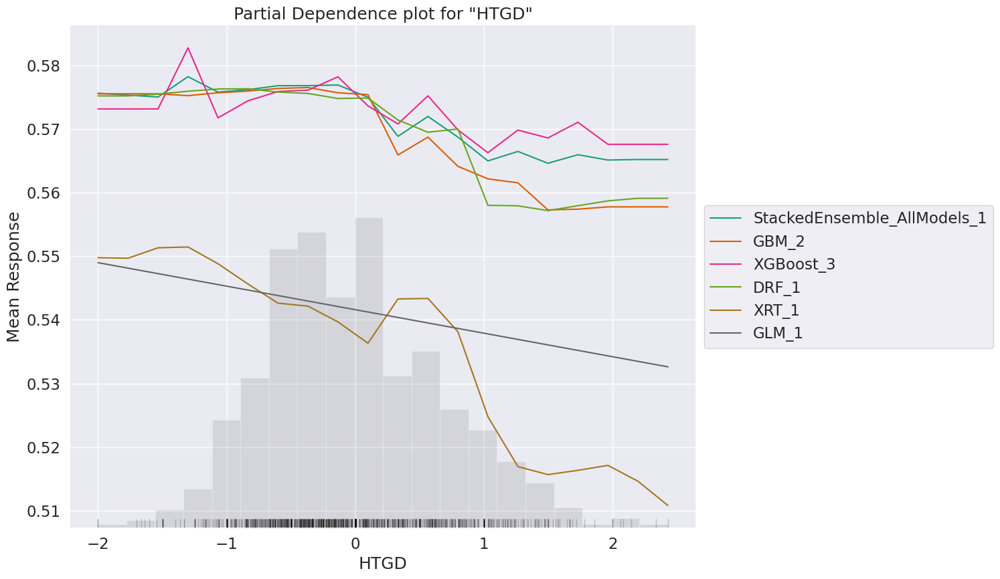

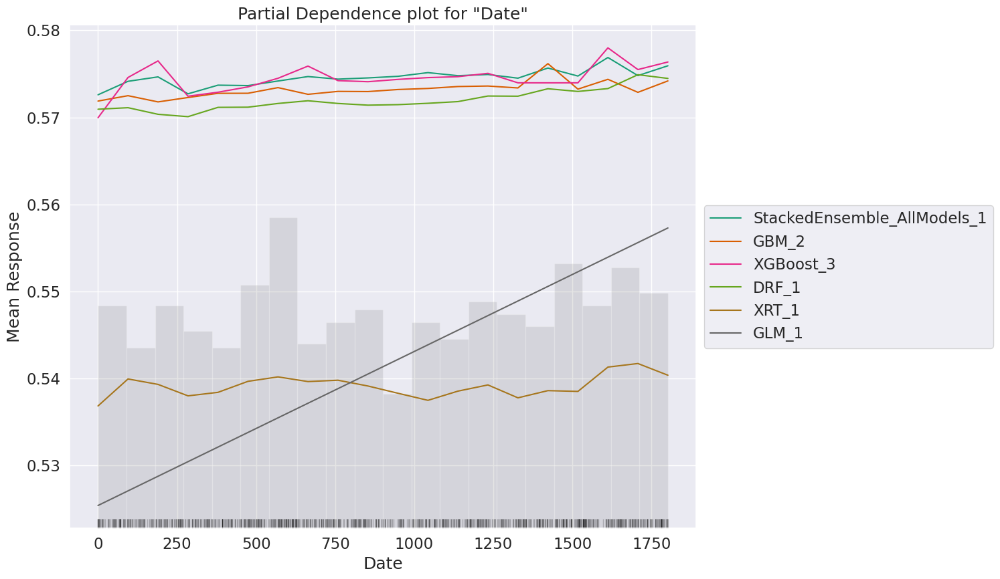

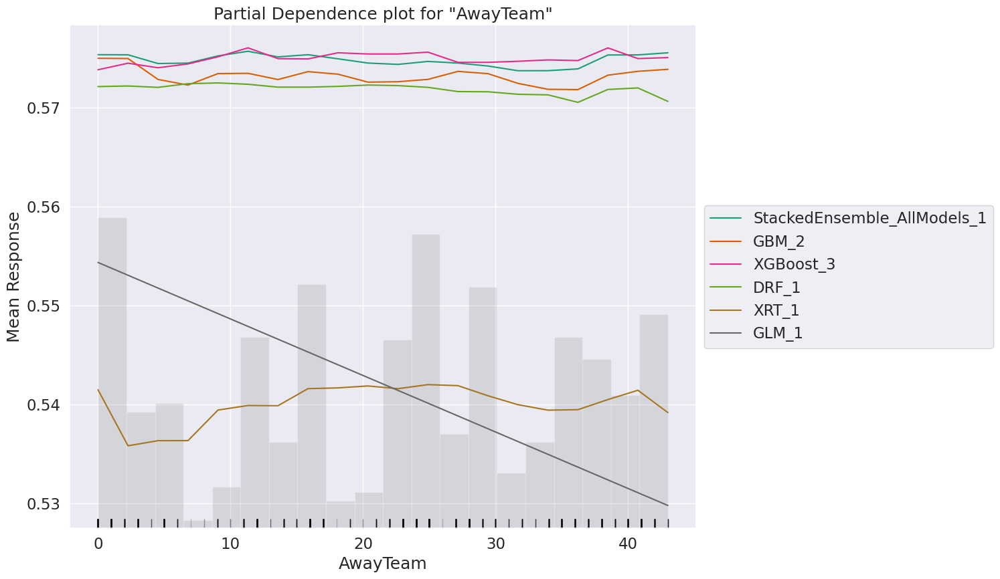

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

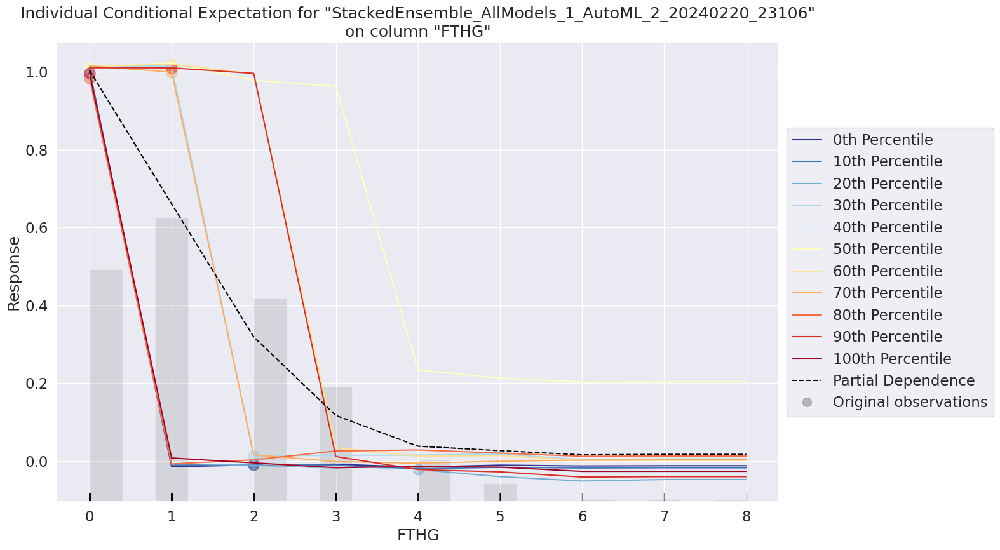

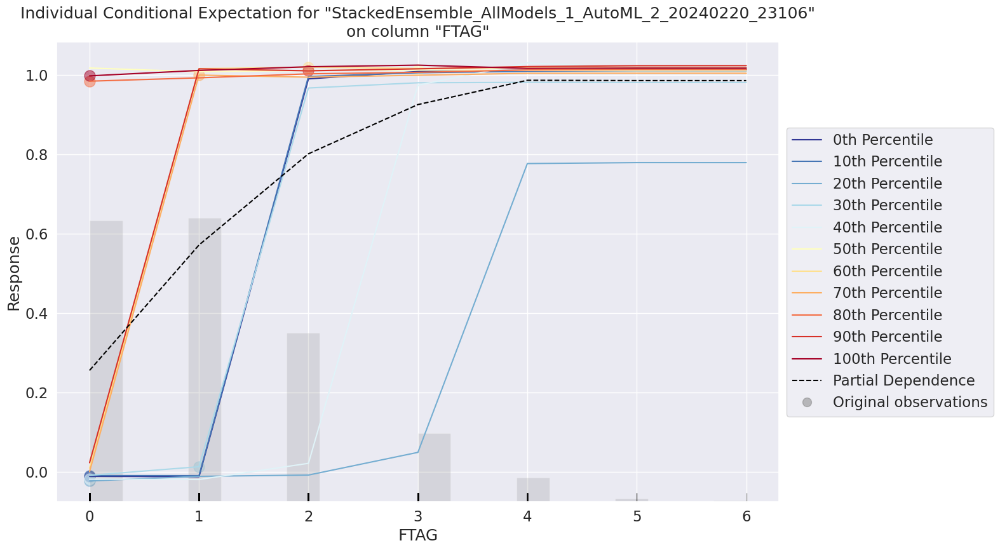

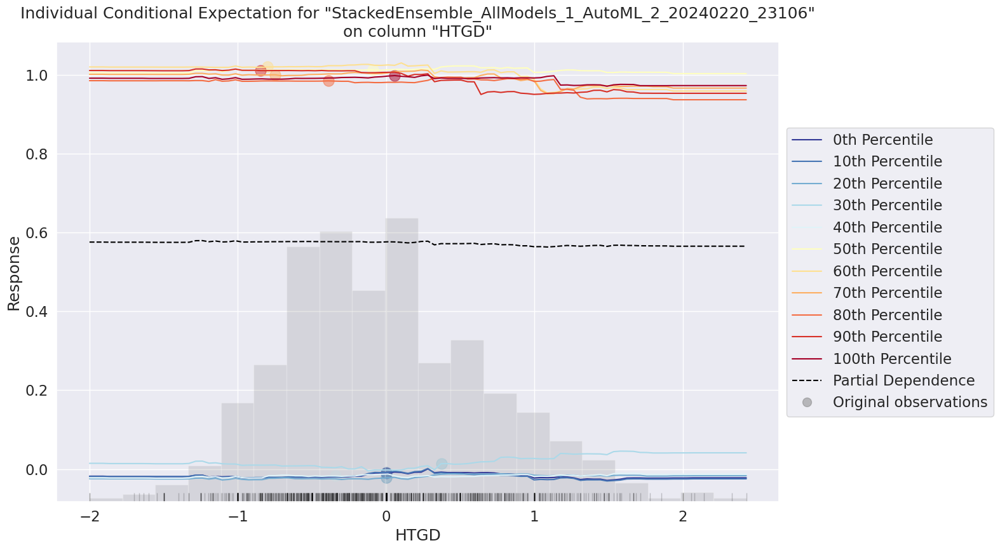

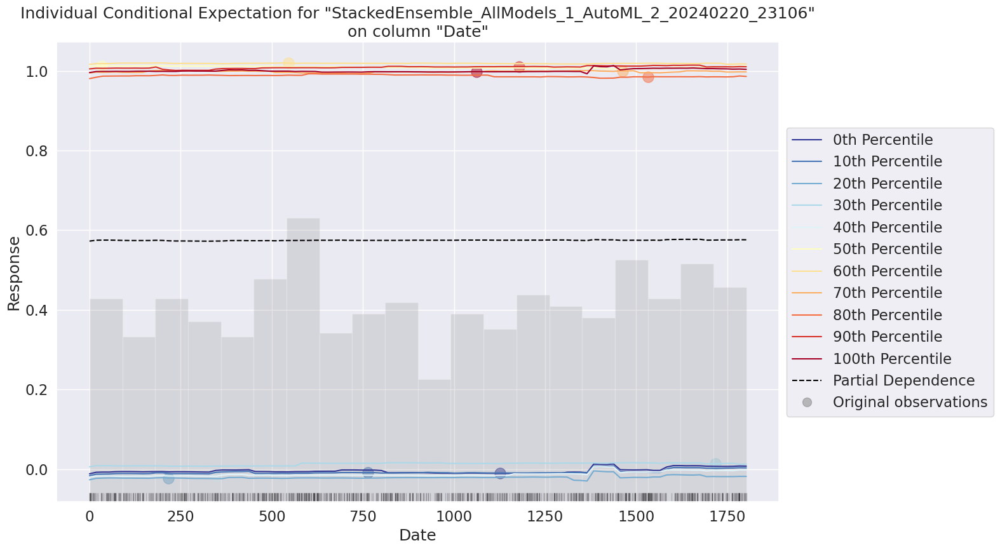

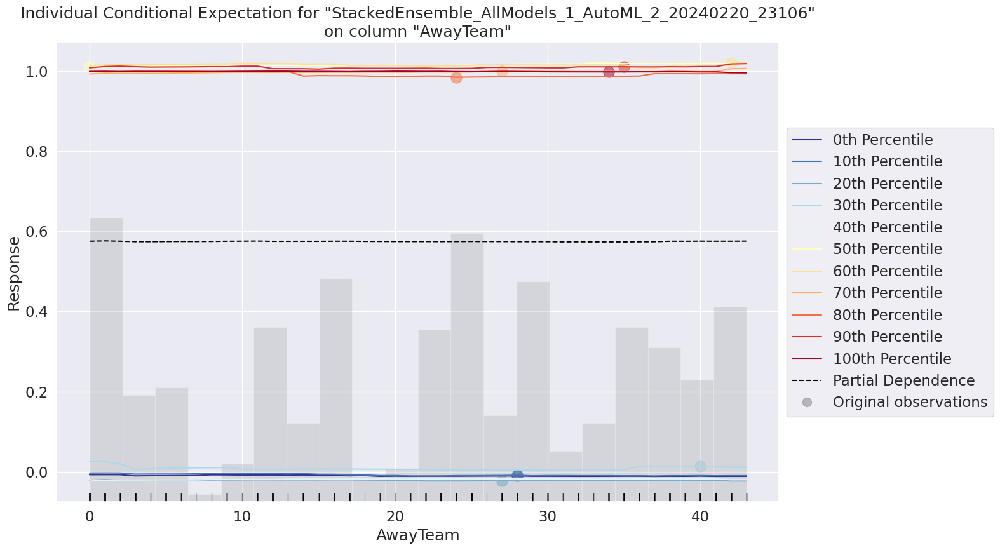

In [155]:
e = aml1.explain(test1)

# Hyperparameter Tuning
To find best set a hyperparameter and combinations of interacting hyperparameters for a given dataset hyperparameters tuning is used. It objectively searches different values for model hyperparameters and chooses a subset that results in a model that achieves the best performance on a given dataset.

In [141]:
s = dff['FTR']

t = dff.drop(['FTR'], axis = 1)

In [142]:
import numpy as np

from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import RandomizedSearchCV

In [143]:

t_train, t_test, s_train, s_test = train_test_split (t, s, random_state = 101, test_size = 0.2)

Here we use RandomizedSearchCV to get the best params inorder to acheive the optimal results

In [144]:
from sklearn.model_selection import RandomizedSearchCV

from sklearn.ensemble import RandomForestRegressor

mode = RandomForestRegressor()

param_vals = {'max_depth': [200, 500, 800, 1100], 'n_estimators': [100,200, 300, 400], 'min_samples_split' : [2,3,5]

}

random_rf = RandomizedSearchCV(estimator=mode, param_distributions=param_vals,

n_iter=10, scoring='accuracy', cv=5,

refit=True, n_jobs=-1)

#Training and prediction

random_rf.fit(t_train, s_train)

preds = random_rf.best_estimator_.predict(t_test)

In [145]:
random_rf.best_params_

{'n_estimators': 100, 'min_samples_split': 5, 'max_depth': 500}

## Conclusion

A regression-based model was developed to forecast hotel prices. To exclude some of the independent variables, tests such as VIF and p-values were taken into account. The H20.ai framework was utilized to train and test the hotel dataset variables on goibibo. The 'gbm' model yielded the highest accuracy of 51% on the test data. The findings indicate that the proposed linear regression model can successfully analyze and predict hotel ratings to a certain degree, but the predictive accuracy is still limited in some cases. Further investigations into alternative models can enhance the model's performance, such as removing outliers and using booster techniques.

**Q1)Is the relationship significant?**

There appears to be a significant relationship between variables which is supported by the high R-squared values obtained in the models and also by the low root mean squared error values in the models.

**Q2)Are any model assumptions violated?**

1.In examining the linear relationship between dependent and independent variables, it is essential to maintain the constancy of other factors. Upon plotting the target variable against each independent variable individually, a linear relationship is evident for several variables while holding others constant. Thus, this assumption remains unviolated.

2.The principle of homoscedasticity, indicating normality in the distribution of errors, is verified by examining the residuals' plot, which should ideally form a bell-shaped curve. In this particular model, this criterion is met satisfactorily.

3.Assessing multicollinearity through correlation analysis reveals some violations of the assumption. Notably, multicollinearity is observed among variables such as HTGD, ATGD, DiffPts, and DiffFormPts.

From this we can say that the assumption is not violated

**Q3)Is there any multicollinearity in the model?**


Multicollinearity occurs when one independent variable is highly correlated with another independent variable, posing a challenge to the statistical significance of individual variables in the model. Detection of multicollinearity can be achieved through the computation of a correlation matrix or by calculating the Variance Inflation Factor (VIF) for each variable. A correlation coefficient close to +1 or -1 in the correlation matrix indicates high correlation between variables, while a VIF value exceeding 10 suggests the presence of multicollinearity. In the current model, several variables exhibited VIF values surpassing 10, indicating the presence of multicollinearity.

**Q4)In the multivariate models are predictor variables independent of all the other predictor variables?**


Independence between variables signifies the absence of any relationship between them. This relationship can be assessed through methods such as correlation matrices or visual examination of graphs to detect any discernible patterns. Upon computation of the correlation matrix for the model, it becomes apparent that HTGD, ATGD, DiffPts, and DiffFormPts exhibit correlations. However, aside from these predictors, the remaining variables demonstrate independence from one another.

**Q5)In in multivariate models rank the most significant predictor variables and exclude insignificant ones from the model.**

From the variable importance plot, the most to least important variables are displayed. For my model FTHG, FTAG, ATFormPtsStr are important varialbles to predict FTR.

**Q6)Does the model make sense?**


To ensure the validity of a model, it should adhere to all assumptions and maintain VIF within acceptable ranges. Additionally, the RMSE should be minimized, taking into account the range of the target variable's minimum and maximum values. The R-squared value of 0.78 is deemed satisfactory in terms of accuracy. Therefore, the model appears to be sensible overall. To enhance accuracy further, certain less significant variables could be dropped. Moreover, outlier removal or the implementation of boosting or ensemble models could be considered.

**Q7)Does regularization help?**


Regularization seems advantageous for managing model complexity and enhancing generalization performance, as indicated by the cross-validation metrics.

**Q8)Which independent variables are significant?**

From variable importance graph we can say that FTHG, FTAG, HTGD are significant variables

**Q9)Which hyperparameters are important?**

Hyperparameter tuning is employed to identify the optimal set and combinations of interacting hyperparameters for a given dataset. This process systematically explores various values for model hyperparameters and selects a subset that yields the highest performance on the dataset. In this particular scenario, hyperparameter tuning was conducted using RandomForestRegressor, resulting in the determination of the best hyperparameters: 'n_estimators': 100, 'min_samples_split': 5, 'max_depth': 500.

## Conclusion

A regression-based model was developed to forecast hotel prices. To exclude some of the independent variables, tests such as VIF was taken into account. The H20.ai framework was utilized to train and test the student performance dataset variables. The findings indicate that the proposed linear regression model can successfully analyze and predict hotel ratings to a certain degree, but the predictive accuracy is still limited in some cases. Further investigations into alternative models can enhance the model's performance, such as removing outliers and using booster techniques.

## REFERENCES

1. W3schools

2. Generate 'n' unique random numbers within a range

3. H20.ai- https://docs.h2o.ai/

4. OLS Model- http://net-informations.com/ds/mla/ols.html

5. Linear Regression- https://www.analyticsvidhya.com/blog/2021/05/all-you-need-to-know-about-your-first-machine-learning-model-linear-regression/

6. Linear Regression Assumptions- https://www.statisticssolutions.com/free-resources/directory-of-statistical-analyses/assumptions-of-linear-regression/

7. Professor's AutoML Notebook- https://github.com/nikbearbrown/AI_Research_Group/tree/main/Kaggle_Datasets/AutoML

MIT License

Copyright (c) 2024 VivekReddy08

Permission is hereby granted, free of charge, to any person obtaining a copy
of this software and associated documentation files (the "Software"), to deal
in the Software without restriction, including without limitation the rights
to use, copy, modify, merge, publish, distribute, sublicense, and/or sell
copies of the Software, and to permit persons to whom the Software is
furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all
copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR
IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY,
FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE
AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER
LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM,
OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE
SOFTWARE.
